In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import cv2 as cv
from sklearn.preprocessing import StandardScaler
import os, fnmatch
from tqdm import tqdm, trange
from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from joblib import dump, load
import itertools

## Load and Convert Data

In [2]:
import cv2
import os

def extract_frames_from_videos(input_folder, output_folder):
    # Ensure the output folder exists or create it
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Get a list of video files in the input folder
    video_files = [f for f in os.listdir(input_folder) if f.endswith('.AVI')]

    for video_file in video_files:
        video_path = os.path.join(input_folder, video_file)

        # Open the video file
        cap = cv2.VideoCapture(video_path)

        # Get the video name (without extension)
        video_name = os.path.splitext(video_file)[0]

        # Counter for frame numbering
        frame_count = 0

        while cap.isOpened():
            ret, frame = cap.read()

            if not ret:
                break

            # Save each frame as an image
            frame_name = f"{video_name}_frame_{frame_count}.png"
            frame_path = os.path.join(output_folder, frame_name)
            cv2.imwrite(frame_path, frame)

            frame_count += 1

        # Release the video capture object
        cap.release()

    print(f"Frames extracted and saved to {output_folder}.")

# Example usage
input_folder = r'D:\python\SLM\Ванны расплава'
output_folder = r'D:\python\SLM\frames'

extract_frames_from_videos(input_folder, output_folder)


Frames extracted and saved to D:\python\SLM\frames.


In [13]:
import os
import numpy as np
from PIL import Image
import pandas as pd
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from tqdm import tqdm

def load_and_preprocess_images(folder_path):
    images = []
    img_size = None

    # Get the total number of files for the progress bar
    total_files = len(os.listdir(folder_path))

    # Use tqdm for a progress bar
    with tqdm(total=total_files, desc="Loading and Preprocessing Images", unit="image") as pbar:
        for filename in os.listdir(folder_path):
            img_path = os.path.join(folder_path, filename)
            img = Image.open(img_path).convert('L')  # Convert to grayscale

            if img_size is None:
                img_size = img.size  # Set img_size based on the dimensions of the first image

            img = img.resize(img_size)
            img_array = np.array(img)
            images.append(img_array)  # Keep images in the original shape

            pbar.update(1)

    return np.array(images), img_size

# Specify your folder path
folder_path = r'D:\python\SLM\frames_small'

# Load and preprocess images
print("Loading and preprocessing images...")
images, img_size = load_and_preprocess_images(folder_path)


Loading and preprocessing images...


Loading and Preprocessing Images: 100%|████████████████████████████████████████| 1500/1500 [00:07<00:00, 212.87image/s]


In [ ]:
import os

folder_path = r'D:\python\SLM\frames_small'

# Get all filenames in the folder
all_files = os.listdir(folder_path)

# Filter only .png filenames
png_files = [filename for filename in all_files if filename.lower().endswith('.png')]

## Loading and Preprocessing random num_images

The same as before but you can chosee not all frames in folder

In [43]:
import os
import numpy as np
from PIL import Image
import pandas as pd
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from tqdm import tqdm

def load_and_preprocess_images(folder_path, num_images=None, seed=42):
    images = []
    png_files = []

    # Get a list of all PNG files in the folder
    all_files = os.listdir(folder_path)
    png_files = [filename for filename in all_files if filename.lower().endswith('.png')]

    # Randomly select num_images from the list
    if num_images is not None:
        np.random.seed(seed)
        selected_files = np.random.choice(png_files, num_images, replace=False)
    else:
        selected_files = png_files

    img_size = None

    # Use tqdm for a progress bar
    with tqdm(total=len(selected_files), desc="Loading and Preprocessing Images", unit="image") as pbar:
        for filename in selected_files:
            img_path = os.path.join(folder_path, filename)
            img = Image.open(img_path).convert('L')  # Convert to grayscale

            if img_size is None:
                img_size = img.size  # Set img_size based on the dimensions of the first image

            img = img.resize(img_size)
            img_array = np.array(img)
            images.append(img_array)  # Keep images in the original shape

            pbar.update(1)

    return np.array(images), img_size, selected_files

# Specify your folder path
folder_path = r'D:\python\SLM\frames'

# Load and preprocess images
print("Loading and preprocessing images...")
images, img_size, png_files = load_and_preprocess_images(folder_path, num_images=50000)

# Now you have the images, img_size, and the selected PNG files in the variables images, img_size, and png_files, respectively.


Loading and preprocessing images...


Loading and Preprocessing Images: 100%|███████████████████████████████████████| 50000/50000 [32:12<00:00, 25.87image/s]


## Reshaping arrays to 1D for each image

In [44]:
img_list = []
for i in range(len(images)):
    img = list(images[i].reshape(-1))
    img_list.append(img)

In [21]:
len(img_list[0])

14400

## Converting to df

In [45]:
df = pd.DataFrame(img_list, columns=[f'Pixel_{i}' for i in range(len(img_list[0]))])
df.insert(0, 'File Name', png_files)  # Add the "File Name" column at the beginning


In [46]:
df.to_csv('pixels_big.csv')

## Apply t-SNE

In [47]:
from tqdm import tqdm
import pandas as pd
from sklearn.manifold import TSNE

# Function to apply t-SNE on columns with 'Pixel' in the name
def apply_tsne_on_pixel_cols(csv_file_path, n_components=3, perplexity=30):
    # Read CSV file into a DataFrame
    df = pd.read_csv(csv_file_path)

    # Select columns with 'Pixel' in the name
    pixel_columns = [col for col in df.columns if 'Pixel' in col]

    # Extract feature vectors from selected columns
    feature_vectors = df[pixel_columns].values

    # Initialize t-SNE model
    tsne = TSNE(n_components=n_components, perplexity=perplexity, random_state=42)

    # Fit and transform using t-SNE
    with tqdm(desc="Fitting and transforming with t-SNE", total=1) as pbar:
        result = tsne.fit_transform(feature_vectors)
        pbar.update(1)

    # Add the t-SNE result to the DataFrame
    tsne_columns = [f'tsne_{i}' for i in range(n_components)]
    df[tsne_columns] = result

    return df[['File Name'] + tsne_columns]

# Example usage:
csv_file_path = r'D:\python\SLM\pixels_big.csv'  # Replace with your CSV file path
result_df = apply_tsne_on_pixel_cols(csv_file_path)

# Save the DataFrame to a new CSV file
new_csv_file_path = 'tsne_result_data.csv'
result_df.to_csv(new_csv_file_path, index=False)

print(f"CSV file with t-SNE result saved at {new_csv_file_path}")



Fitting and transforming with t-SNE: 100%|█████████████████████████████████████████████| 1/1 [18:29<00:00, 1109.04s/it]


CSV file with t-SNE result saved at tsne_result_data.csv


# Visualization 

## Without labels

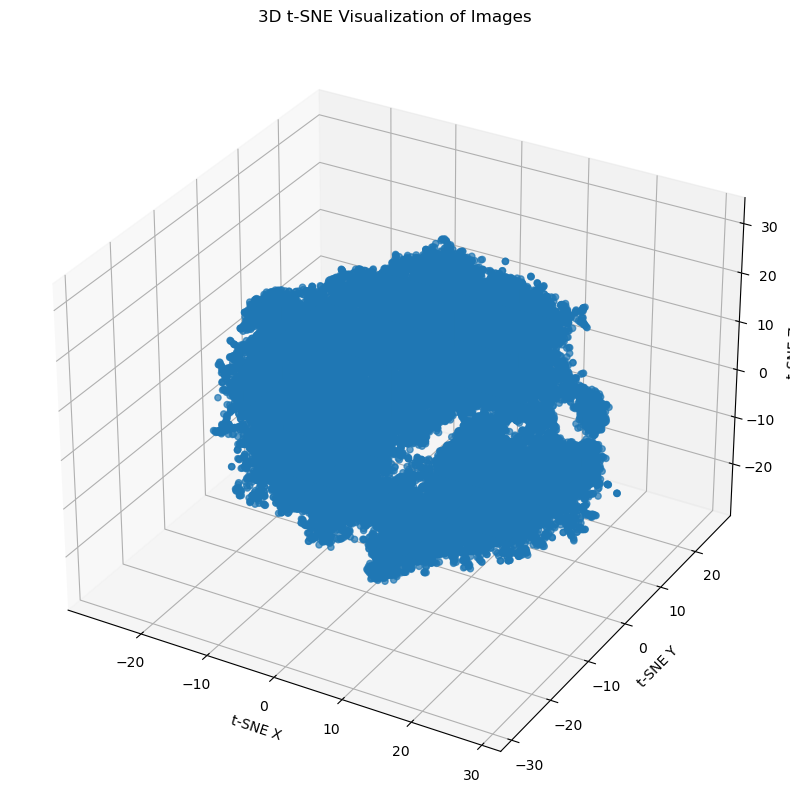

In [49]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_tsne_3d(tsne_results, labels=None):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    if labels is not None:
        scatter = ax.scatter(tsne_results['tsne_0'], tsne_results['tsne_1'], tsne_results['tsne_2'], c=labels, cmap='viridis', alpha=0.7)
        fig.colorbar(scatter, ax=ax, label='Labels')
    else:
        scatter = ax.scatter(tsne_results['tsne_0'], tsne_results['tsne_1'], tsne_results['tsne_2'], alpha=0.7)

    ax.set_xlabel('t-SNE X')
    ax.set_ylabel('t-SNE Y')
    ax.set_zlabel('t-SNE Z')
    plt.title('3D t-SNE Visualization of Images')
    plt.show()

# Example usage:
plot_tsne_3d(tsne_results=result_df)


## Clasterization

In [3]:
import pandas as pd
tsne_csv_file = pd.read_csv('tsne_result_data.csv')

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Extract t-SNE coordinates for clustering
tsne_coordinates = tsne_csv_file[['tsne_0', 'tsne_1', 'tsne_2']]

# Number of clusters (you can adjust this)
num_clusters = 20

# Apply k-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
tsne_csv_file['cluster'] = kmeans.fit_predict(tsne_coordinates)

new_df = tsne_csv_file[['File Name', 'cluster']]
new_df.to_csv('tsne_result_data_kmeans20.csv')

D:\Users\ivan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [133]:
import pandas as pd
from sklearn.cluster import KMeans

# Assuming tsne_csv_file is your DataFrame with t-SNE coordinates
tsne_coordinates = tsne_csv_file[['tsne_0', 'tsne_1', 'tsne_2']]

# Number of clusters to iterate through
cluster_range = range(10, 20)

# Create an empty DataFrame to store the results
result_df = pd.DataFrame({'File Name': tsne_csv_file['File Name']})

# Iterate through different cluster numbers
for num_clusters in cluster_range:
    # Apply k-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    result_df[f'kmeans_{num_clusters}'] = kmeans.fit_predict(tsne_coordinates)

# Save the results to a CSV file
result_df.to_csv('tsne_kmeans_results_all.csv', index=False)


D:\Users\ivan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Users\ivan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Users\ivan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Users\ivan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_

In [148]:
import pandas as pd
from sklearn.cluster import DBSCAN

# Assuming tsne_csv_file is your DataFrame with t-SNE coordinates
tsne_coordinates = tsne_csv_file[['tsne_0', 'tsne_1', 'tsne_2']]

# Set the range of eps values to iterate through
eps_range = [0.5, 1.0, 1.5]

# Create an empty DataFrame to store the results
result_df = pd.DataFrame({'File Name': tsne_csv_file['File Name']})

# Iterate through different eps values
for eps_value in eps_range:
    # Apply DBSCAN clustering
    dbscan = DBSCAN(eps=eps_value)
    result_df[f'dbscan_eps_{eps_value}'] = dbscan.fit_predict(tsne_coordinates)

# Save the results to a CSV file
result_df.to_csv('tsne_dbscan_results_all.csv', index=False)


In [150]:
set(result_df['dbscan_eps_1.5'])

{-1,
 0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43}

In [171]:
labels_ = new_df['cluster']

C:\Users\ivan\AppData\Local\Temp\ipykernel_16036\977644845.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('viridis', len(unique_labels))


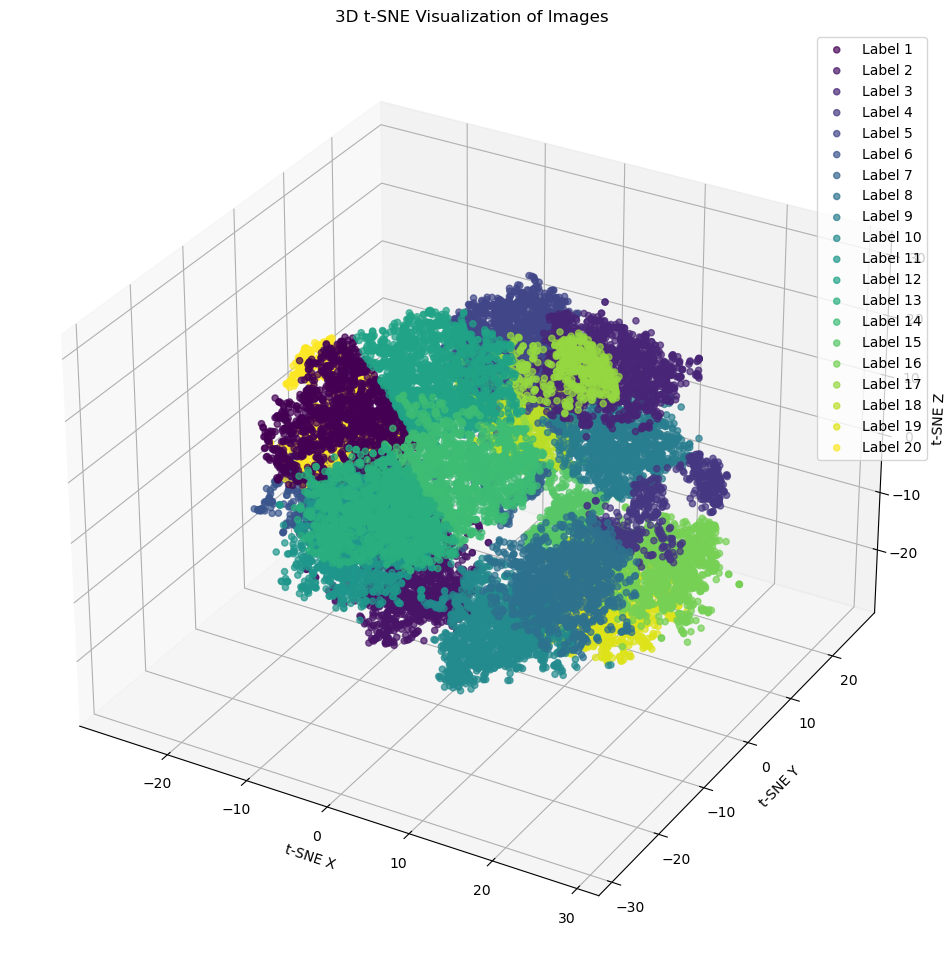

In [178]:
import numpy as np
#%matplotlib notebook
def plot_tsne_3d(tsne_results, labels=None, num_samples=None, random_seed=42):
    # Select a specified number of random samples
    if num_samples is not None:
        np.random.seed(random_seed)
        selected_indices = np.random.choice(len(tsne_results), num_samples, replace=False)
        tsne_results = tsne_results.iloc[selected_indices]

        if labels is not None:
            labels = labels[selected_indices]
            

    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111, projection='3d')
    
    scatter = None
    if labels is not None:
        unique_labels = np.unique(labels)
        colormap = plt.cm.get_cmap('viridis', len(unique_labels))

        for i, label in enumerate(unique_labels):
            label_mask = labels == label
            scatter = ax.scatter(
                tsne_results.loc[label_mask, 'tsne_0'],
                tsne_results.loc[label_mask, 'tsne_1'],
                tsne_results.loc[label_mask, 'tsne_2'],
                c=[colormap(i)] * np.sum(label_mask),
                label=f'Label {label+1}',
                alpha=0.7
            )
    #fig.colorbar(scatter, ax=ax, label='Labels')
            

    ax.set_xlabel('t-SNE X')
    ax.set_ylabel('t-SNE Y')
    ax.set_zlabel('t-SNE Z')

    # Remove grids
    #ax.grid(False)
    
    # Remove ticks
    #ax.set_xticks([])
    #ax.set_yticks([])
    #ax.set_zticks([])
    
    if scatter is not None:
        ax.legend()
    plt.title('3D t-SNE Visualization of Images')
    plt.savefig('tsne_25000.pdf')
    plt.show()


# Example usage:
# Assuming 'tsne_results' is your DataFrame with t-SNE coordinates and 'labels' is the corresponding label array.
# You can specify the number of random samples to plot using the 'num_samples' parameter.
plot_tsne_3d(tsne_results=tsne_csv_file, labels=labels_, num_samples=25000)

# Example usage:
#plot_tsne_3d(tsne_results=result_df, labels=labels_)

C:\Users\ivan\AppData\Local\Temp\ipykernel_16036\1792377826.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('viridis', len(unique_labels))


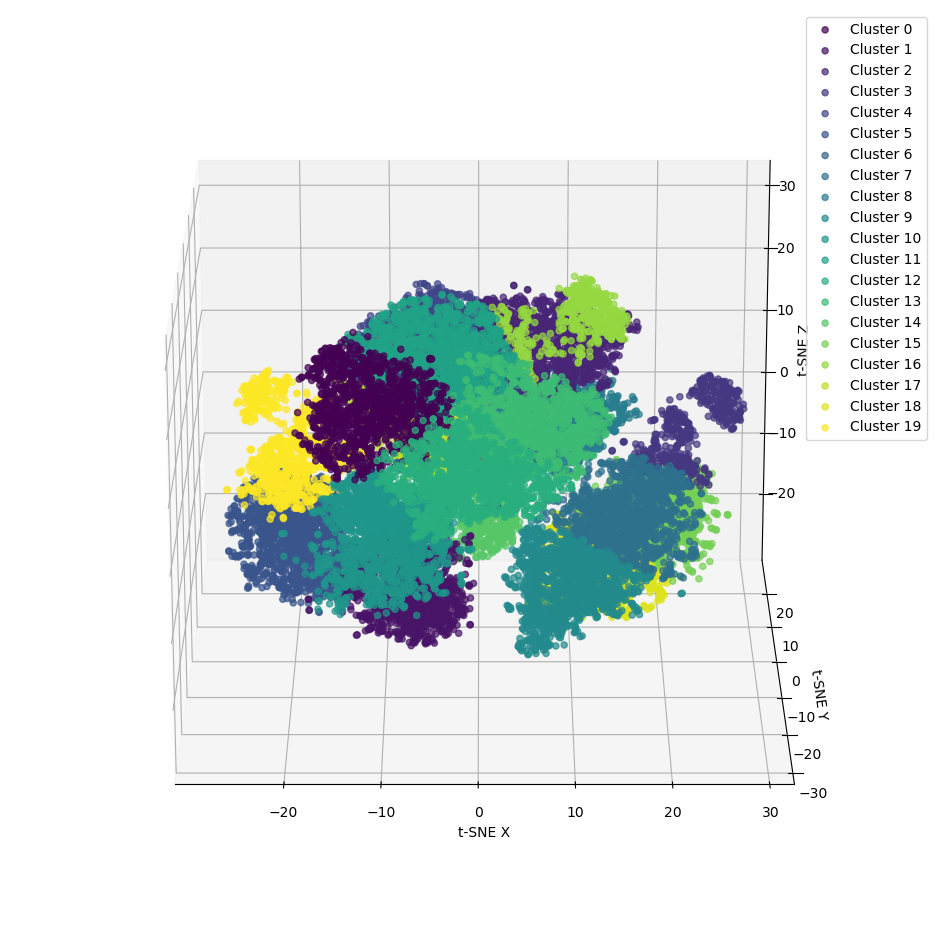

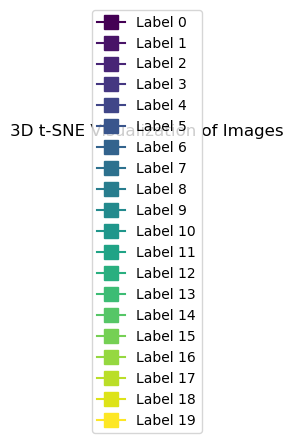

In [193]:
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages

def plot_tsne_3d(tsne_results, labels=None, num_samples=None, random_seed=42, rotation_angle=-90):
    # Select a specified number of random samples
    if num_samples is not None:
        np.random.seed(random_seed)
        selected_indices = np.random.choice(len(tsne_results), num_samples, replace=False)
        tsne_results = tsne_results.iloc[selected_indices]

        if labels is not None:
            labels = labels[selected_indices]

    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111, projection='3d')
    
    scatter = None
    if labels is not None:
        unique_labels = np.unique(labels)
        colormap = plt.cm.get_cmap('viridis', len(unique_labels))

        for i, label in enumerate(unique_labels):
            label_mask = labels == label
            scatter = ax.scatter(
                tsne_results.loc[label_mask, 'tsne_0'],
                tsne_results.loc[label_mask, 'tsne_1'],
                tsne_results.loc[label_mask, 'tsne_2'],
                c=[colormap(i)] * np.sum(label_mask),
                label=f'Cluster {label}',
                alpha=0.7
            )

    ax.set_xlabel('t-SNE X')
    ax.set_ylabel('t-SNE Y')
    ax.set_zlabel('t-SNE Z')

    # Rotate the view by 90 degrees around the z-axis
    ax.view_init(elev=20, azim=rotation_angle)

    if scatter is not None:
        ax.legend()
    
    # Create a legend with unique colors as squares
    unique_colors = [colormap(i) for i in range(len(unique_labels))]
    legend_labels = [f'Label {label}' for label in unique_labels]

    legend_fig, legend_ax = plt.subplots(figsize=(2, 2))
    legend_ax.set_axis_off()
    legend_ax.legend(handles=[plt.Line2D([0], [0], marker='s', color=color, label=label, markersize=10)
                             for color, label in zip(unique_colors, legend_labels)],
                     loc='center')

    # Save the legend to a PDF file
    legend_fig.savefig('legend__.pdf', bbox_inches='tight')

    # Save individual images for each unique color
    with PdfPages('unique_color_images.pdf') as pdf:
        for i, color in enumerate(unique_colors):
            color_fig, color_ax = plt.subplots(figsize=(2, 2))
            color_ax.set_axis_off()
            color_ax.add_patch(plt.Rectangle((0, 0), 1, 1, color=color))
            pdf.savefig(color_fig, bbox_inches='tight')
            plt.close(color_fig)

    
    plt.title('3D t-SNE Visualization of Images')
    plt.savefig('tsne_25000_rotated_4.pdf')
    plt.show()

# Example usage:
# Assuming 'tsne_results' is your DataFrame with t-SNE coordinates and 'labels' is the corresponding label array.
# You can specify the number of random samples to plot using the 'num_samples' parameter.
plot_tsne_3d(tsne_results=tsne_csv_file, labels=labels_, num_samples=25000)


In [16]:
import plotly.graph_objects as go
import numpy as np

def plot_tsne_3d_plotly(tsne_results, labels=None, num_samples=None, random_seed=42):
    # Select a specified number of random samples
    if num_samples is not None:
        np.random.seed(random_seed)
        selected_indices = np.random.choice(len(tsne_results), num_samples, replace=False)
        tsne_results = tsne_results.iloc[selected_indices]

        if labels is not None:
            labels = labels[selected_indices]

    # Create 3D scatter plot
    fig = go.Figure()

    if labels is not None:
        unique_labels = np.unique(labels)
        colormap = plt.cm.get_cmap('viridis', len(unique_labels))

        for i, label in enumerate(unique_labels):
            label_mask = labels == label
            scatter = go.Scatter3d(
                x=tsne_results.loc[label_mask, 'tsne_0'],
                y=tsne_results.loc[label_mask, 'tsne_1'],
                z=tsne_results.loc[label_mask, 'tsne_2'],
                mode='markers',
                marker=dict(color=[colormap(i)] * np.sum(label_mask)),
                name=f'Label {label}'
            )
            fig.add_trace(scatter)
    else:
        scatter = go.Scatter3d(
            x=tsne_results['tsne_0'],
            y=tsne_results['tsne_1'],
            z=tsne_results['tsne_2'],
            mode='markers',
            marker=dict(color='blue'),
        )
        fig.add_trace(scatter)

    # Update layout
    fig.update_layout(
        scene=dict(
            xaxis=dict(title='t-SNE X'),
            yaxis=dict(title='t-SNE Y'),
            zaxis=dict(title='t-SNE Z'),
        )
    )

    # Show the plot
    fig.show()

# Example usage:
# Assuming 'tsne_results' is your DataFrame with t-SNE coordinates and 'labels' is the corresponding label array.
# You can specify the number of random samples to plot using the 'num_samples' parameter.
plot_tsne_3d_plotly(tsne_csv_file, labels=labels_, num_samples=20000)


C:\Users\ivan\AppData\Local\Temp\ipykernel_6960\2123548859.py:19: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



In [89]:
new_df = pd.read_csv('tsne_result_data_kmeans20.csv')

In [90]:
new_df

,Unnamed: 0,File Name,cluster
0,0,MPMcamera_L0004_frame_1872.png,2
1,1,MPMcamera_L0014_frame_7182.png,11
2,2,MPMcamera_L0013_frame_15439.png,9
3,3,MPMcamera_L0005_frame_9735.png,9
4,4,MPMcamera_L0024_frame_5086.png,13
...,...,...,...
49995,49995,MPMcamera_L0026_frame_5020.png,2
49996,49996,MPMcamera_L0004_frame_5297.png,13
49997,49997,MPMcamera_L0013_frame_19691.png,7
49998,49998,MPMcamera_L0018_frame_20511.png,4


In [58]:
df = tsne_csv_file
df

,File Name,tsne_0,tsne_1,tsne_2,layer,frame
0,MPMcamera_L0004_frame_1872.png,9.063983,13.772847,8.917250,0004,1872
1,MPMcamera_L0014_frame_7182.png,-3.114235,1.231467,21.953930,0014,7182
2,MPMcamera_L0013_frame_15439.png,8.936671,-17.419888,-4.969149,0013,15439
3,MPMcamera_L0005_frame_9735.png,16.432890,-10.215157,-12.698613,0005,9735
4,MPMcamera_L0024_frame_5086.png,5.318348,-13.197643,16.068375,0024,5086
...,...,...,...,...,...,...
49995,MPMcamera_L0026_frame_5020.png,3.345308,9.774157,9.840611,0026,5020
49996,MPMcamera_L0004_frame_5297.png,4.392627,-12.372669,15.623923,0004,5297
49997,MPMcamera_L0013_frame_19691.png,10.724375,-13.458207,-0.333156,0013,19691
49998,MPMcamera_L0018_frame_20511.png,-4.516095,19.519342,19.094126,0018,20511


In [40]:
# Extract 'layer' and 'frame' information from 'File Name'
df['layer'] = df['File Name'].str.extract(r'L(\d+)')
df['frame'] = df['File Name'].str.extract(r'frame_(\d+)')

In [43]:
df.to_csv('tsne_result_data.csv')

In [42]:
import os
import pandas as pd

# Specify the folder path
folder_path = r'D:\python\SLM\XYPT Commands'

# Function to get the number of rows in an Excel file
def get_num_rows(file_path):
    try:
        df = pd.read_csv(file_path)
        return len(df)
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
        return None

# List to store results
summary_list = []

# Iterate through each .xlsx file in the folder
for filename in os.listdir(folder_path):
    if filename.endswith(".csv"):
        file_path = os.path.join(folder_path, filename)
        
        # Get the number of rows
        num_rows = get_num_rows(file_path)

        # Append to the list if successful
        if num_rows is not None:
            summary_list.append({'Filename': filename, 'NumRows': num_rows})
            #print(f"Statistical summary for {filename}: {num_rows} rows")

# Optionally, save the list to a CSV file
csv_filename = 'summary_results.csv'
csv_filepath = os.path.join(folder_path, csv_filename)
pd.DataFrame(summary_list).to_csv(csv_filepath, index=False)
print(f"\nSummary list saved to {csv_filepath}")

# Return the summary list
#summary_list




Summary list saved to D:\python\SLM\XYPT Commands\summary_results.csv


In [27]:
stat = pd.read_excel('stat_layers.xlsx')

In [44]:
import os
import pandas as pd
import re

# Specify the folder path
folder_path = r'D:\python\SLM\frames'

# Function to extract numbers from 'File Name'
def extract_numbers(filename):
    first_number = int(re.search(r'L(\d+)', filename).group(1))
    second_number = int(re.search(r'frame_(\d+)', filename).group(1))
    return first_number, second_number

# Create a list to store extracted numbers
numbers_list = []

# Iterate through each filename in the folder
for filename in os.listdir(folder_path):
    if filename.endswith(".png"):
        first_number, second_number = extract_numbers(filename)
        numbers_list.append({'FirstNumber': first_number, 'SecondNumber': second_number})

# Create a DataFrame from the list
df = pd.DataFrame(numbers_list)

# Get unique first numbers and their corresponding maximum second numbers
result_df = df.groupby('FirstNumber')['SecondNumber'].max().reset_index()

# Rename columns
result_df.columns = ['FirstNumber', 'MaxSecondNumber']

# Print the result DataFrame
#print(result_df)


In [33]:
stat['Frames'] = result_df['MaxSecondNumber']

In [56]:
stat = pd.read_excel('stat_layers.xlsx')

In [57]:
stat

,Unnamed: 0,Filename,NumRows,Frames,layer
0,0,XYPT_L0001.csv,395365,23683,1
1,1,XYPT_L0002.csv,352347,23875,2
2,2,XYPT_L0003.csv,402909,24207,3
3,3,XYPT_L0004.csv,354397,24327,4
4,4,XYPT_L0005.csv,409969,24691,5
5,5,XYPT_L0006.csv,365306,24759,6
6,6,XYPT_L0007.csv,424113,25195,7
7,7,XYPT_L0008.csv,368985,25211,8
8,8,XYPT_L0009.csv,420102,25447,9
9,9,XYPT_L0010.csv,364349,25211,10


In [61]:
df = pd.read_excel('tsne.xlsx')

In [62]:
df

,Unnamed: 0,File Name,tsne_0,tsne_1,tsne_2,layer,frame
0,0,MPMcamera_L0004_frame_1872.png,9.063983,13.772847,8.917250,4,1872
1,1,MPMcamera_L0014_frame_7182.png,-3.114235,1.231467,21.953930,14,7182
2,2,MPMcamera_L0013_frame_15439.png,8.936671,-17.419888,-4.969149,13,15439
3,3,MPMcamera_L0005_frame_9735.png,16.432890,-10.215157,-12.698613,5,9735
4,4,MPMcamera_L0024_frame_5086.png,5.318348,-13.197643,16.068375,24,5086
...,...,...,...,...,...,...,...
49995,49995,MPMcamera_L0026_frame_5020.png,3.345308,9.774157,9.840611,26,5020
49996,49996,MPMcamera_L0004_frame_5297.png,4.392627,-12.372669,15.623923,4,5297
49997,49997,MPMcamera_L0013_frame_19691.png,10.724375,-13.458207,-0.333156,13,19691
49998,49998,MPMcamera_L0018_frame_20511.png,-4.516095,19.519342,19.094126,18,20511


In [ ]:
df['frame']/stat['frames'] *

In [67]:
# Merge df and stat on the 'layer' column
merged_df = pd.merge(df, stat, on='layer', how='left')

# Create the new column 'number' based on the specified rule
merged_df['number'] = (merged_df['frame'] / merged_df['Frames']) * merged_df['NumRows']
merged_df['number'] = merged_df['number'].round()

In [70]:
merged_df = pd.read_csv('numbs.csv')

In [71]:
merged_df

,Unnamed: 0,Unnamed: 0_x,File Name,tsne_0,tsne_1,tsne_2,layer,frame,Unnamed: 0_y,Filename,NumRows,Frames,number
0,0,0,MPMcamera_L0004_frame_1872.png,9.063983,13.772847,8.917250,4,1872,3,XYPT_L0004.csv,354397,24327,27271.0
1,1,1,MPMcamera_L0014_frame_7182.png,-3.114235,1.231467,21.953930,14,7182,13,XYPT_L0014.csv,364181,25231,103664.0
2,2,2,MPMcamera_L0013_frame_15439.png,8.936671,-17.419888,-4.969149,13,15439,12,XYPT_L0013.csv,421113,25447,255494.0
3,3,3,MPMcamera_L0005_frame_9735.png,16.432890,-10.215157,-12.698613,5,9735,4,XYPT_L0005.csv,409969,24691,161640.0
4,4,4,MPMcamera_L0024_frame_5086.png,5.318348,-13.197643,16.068375,24,5086,23,XYPT_L0024.csv,369345,25211,74511.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,49995,49995,MPMcamera_L0026_frame_5020.png,3.345308,9.774157,9.840611,26,5020,25,XYPT_L0026.csv,364181,25231,72458.0
49996,49996,49996,MPMcamera_L0004_frame_5297.png,4.392627,-12.372669,15.623923,4,5297,3,XYPT_L0004.csv,354397,24327,77167.0
49997,49997,49997,MPMcamera_L0013_frame_19691.png,10.724375,-13.458207,-0.333156,13,19691,12,XYPT_L0013.csv,421113,25447,325859.0
49998,49998,49998,MPMcamera_L0018_frame_20511.png,-4.516095,19.519342,19.094126,18,20511,17,XYPT_L0018.csv,366097,25211,297847.0


In [74]:
# Specify the folder path for CSV files
csv_folder_path = r'D:\python\SLM\XYPT Commands'


# Function to parse CSV file based on 'number'
def parse_csv_by_number(row):
    csv_filename = row['Filename']
    csv_filepath = os.path.join(csv_folder_path, csv_filename)
    try:
        df_csv = pd.read_csv(csv_filepath, header=None)  # No header for column names
        row_number = int(row['number'])
        parsed_row = df_csv.iloc[row_number - 1]  # Assuming 'number' is 1-indexed
        return [parsed_row[0], parsed_row[1], parsed_row[2], parsed_row[3]]
    except Exception as e:
        print(f"Error parsing {csv_filename}: {e}")
        return [None, None, None, None]

# Apply the function to each row in merged_df
parsed_values = merged_df.apply(parse_csv_by_number, axis=1, result_type='expand')

# Add the parsed values as new columns to merged_df
merged_df[['parsed_x', 'parsed_y', 'parsed_power', 'parsed_trigger']] = parsed_values



In [75]:
merged_df.to_csv('numbs_ext.csv')

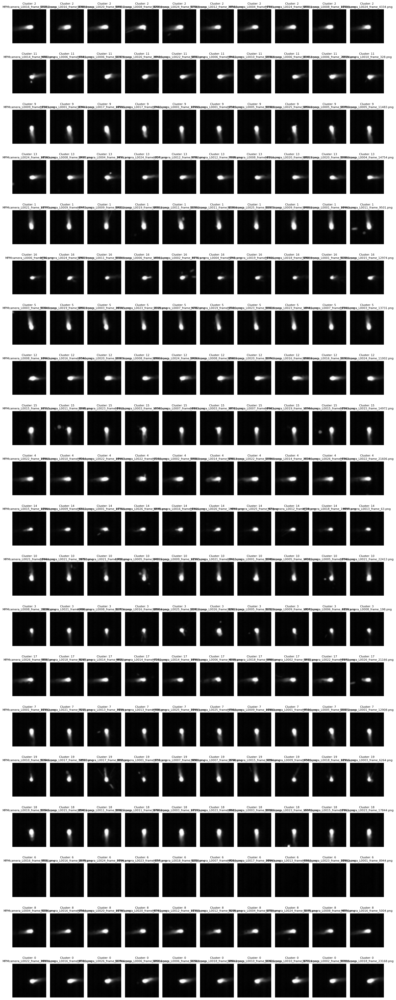

In [31]:
# Specify the folder path
img_folder = 'D:/python/SLM/frames/'

# Function to load and resize image
def load_and_resize_image(img_path, size=(50, 50)):
    img = Image.open(img_path)
    img = img.resize(size)
    return img

# Function to create subplots
def create_subplots(df, img_folder):
    # Get unique clusters
    unique_clusters = df['cluster'].unique()

    # Set the number of random figures for each cluster
    num_random_figures = 10

    # Create subplots
    fig, axes = plt.subplots(len(unique_clusters), num_random_figures, figsize=(15, 2 * len(unique_clusters)))

    for i, cluster in enumerate(unique_clusters):
        # Select rows for the current cluster
        cluster_data = df[df['cluster'] == cluster]

        # Select random rows
        random_rows = cluster_data.sample(n=num_random_figures, replace=True)

        for j, (_, row) in enumerate(random_rows.iterrows()):
            # Load and resize the image
            img_path = os.path.join(img_folder, row['File Name'])
            img = load_and_resize_image(img_path)

            # Display the image on the subplot
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            axes[i, j].set_title(f'Cluster: {cluster}\n{row["File Name"]}', fontsize=8)

    # Adjust layout
    plt.tight_layout()
    plt.savefig('all_clusters.pdf')
    plt.show()

# Example usage
create_subplots(tsne_csv_file, img_folder)

In [76]:
df = pd.read_excel('tsne_areas.xlsx')

In [77]:
df

,Unnamed: 0.1,Unnamed: 0,File Name,tsne_0,tsne_1,tsne_2,layer,frame,White Pixel Count,White Area Percentage
0,0,0,MPMcamera_L0004_frame_1872.png,9.063983,13.772847,8.917250,4,1872,202,1.402778
1,1,1,MPMcamera_L0014_frame_7182.png,-3.114235,1.231467,21.953930,14,7182,161,1.118056
2,2,2,MPMcamera_L0013_frame_15439.png,8.936671,-17.419888,-4.969149,13,15439,214,1.486111
3,3,3,MPMcamera_L0005_frame_9735.png,16.432890,-10.215157,-12.698613,5,9735,224,1.555556
4,4,4,MPMcamera_L0024_frame_5086.png,5.318348,-13.197643,16.068375,24,5086,189,1.312500
...,...,...,...,...,...,...,...,...,...,...
49995,49995,49995,MPMcamera_L0026_frame_5020.png,3.345308,9.774157,9.840611,26,5020,204,1.416667
49996,49996,49996,MPMcamera_L0004_frame_5297.png,4.392627,-12.372669,15.623923,4,5297,185,1.284722
49997,49997,49997,MPMcamera_L0013_frame_19691.png,10.724375,-13.458207,-0.333156,13,19691,212,1.472222
49998,49998,49998,MPMcamera_L0018_frame_20511.png,-4.516095,19.519342,19.094126,18,20511,242,1.680556


In [2]:
import pandas as pd
result_df = pd.read_excel('FINAL.xlsx')

In [3]:
result_df

,File Name,tsne_0,tsne_1,tsne_2,layer,frame,Filename,NumRows,Frames,number,...,kmeans_11,kmeans_12,kmeans_13,kmeans_14,kmeans_15,kmeans_16,kmeans_17,kmeans_18,kmeans_19,kmeans_20
0,MPMcamera_L0004_frame_1872.png,9.063983,13.772847,8.917250,4,1872,XYPT_L0004.csv,354397,24327,27271,...,6,7,2,0,7,11,5,17,9,2
1,MPMcamera_L0014_frame_7182.png,-3.114235,1.231467,21.953930,14,7182,XYPT_L0014.csv,364181,25231,103664,...,8,0,11,12,2,3,4,9,8,11
2,MPMcamera_L0013_frame_15439.png,8.936671,-17.419888,-4.969149,13,15439,XYPT_L0013.csv,421113,25447,255494,...,9,9,12,9,1,8,2,8,10,9
3,MPMcamera_L0005_frame_9735.png,16.432890,-10.215157,-12.698613,5,9735,XYPT_L0005.csv,409969,24691,161640,...,9,9,12,9,1,8,2,8,10,9
4,MPMcamera_L0024_frame_5086.png,5.318348,-13.197643,16.068375,24,5086,XYPT_L0024.csv,369345,25211,74511,...,1,2,4,2,6,13,14,5,16,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,MPMcamera_L0026_frame_5020.png,3.345308,9.774157,9.840611,26,5020,XYPT_L0026.csv,364181,25231,72458,...,6,7,2,0,7,11,5,17,9,2
49996,MPMcamera_L0004_frame_5297.png,4.392627,-12.372669,15.623923,4,5297,XYPT_L0004.csv,354397,24327,77167,...,1,2,4,2,6,13,14,5,16,13
49997,MPMcamera_L0013_frame_19691.png,10.724375,-13.458207,-0.333156,13,19691,XYPT_L0013.csv,421113,25447,325859,...,9,9,12,9,1,8,2,8,1,7
49998,MPMcamera_L0018_frame_20511.png,-4.516095,19.519342,19.094126,18,20511,XYPT_L0018.csv,366097,25211,297847,...,2,6,6,6,14,5,7,4,13,4


In [3]:
result_df['kmeans_20'].value_counts()

5     3856
10    3676
11    3218
4     3025
17    3021
9     2915
7     2878
2     2830
12    2818
18    2808
0     2765
13    2730
8     2535
1     2530
15    2446
19    2043
16    1073
14    1060
3     1040
6      733
Name: kmeans_20, dtype: int64

In [169]:
# Import the Image module
from PIL import Image

# Specify the folder path
img_folder = 'D:/python/SLM/frames/'

# Function to load and resize image
def load_and_resize_image(img_path, size=(50, 50)):
    img = Image.open(img_path)
    img = img.resize(size)
    return img

# Function to create subplots
def create_subplots(df, img_folder, kmeans_columns):
    # Set the number of random figures for each cluster
    num_random_figures = 10

    for kmeans_col in kmeans_columns:
        # Get unique clusters
        unique_clusters = df[kmeans_col].unique()

        # Create subplots
        fig, axes = plt.subplots(len(unique_clusters), num_random_figures, figsize=(15, 2 * len(unique_clusters)))

        for i, cluster in enumerate(unique_clusters):
            # Select rows for the current cluster
            cluster_data = df[df[kmeans_col] == cluster]

            # Select random rows
            random_rows = cluster_data.sample(n=num_random_figures, replace=True)

            for j, (_, row) in enumerate(random_rows.iterrows()):
                # Load and resize the image
                img_path = os.path.join(img_folder, row['File Name'])
                img = load_and_resize_image(img_path)

                # Display the image on the subplot
                axes[i, j].imshow(img)
                axes[i, j].axis('off')
                axes[i, j].set_title(f'{kmeans_col}: {cluster}\n{row["File Name"]}', fontsize=8)

        # Adjust layout
        plt.tight_layout()
        pdf_filename = f'cluster_{kmeans_col}.pdf'
        plt.savefig(pdf_filename)
        print(f'Saved {pdf_filename}')
        plt.close()

# Example usage with kmeans columns
kmeans_columns = ['kmeans_11', 'kmeans_12', 'kmeans_13', 'kmeans_14', 'kmeans_15', 'kmeans_16', 'kmeans_17', 'kmeans_18', 'kmeans_19', 'kmeans_20']
create_subplots(result_df, img_folder, kmeans_columns)


Saved cluster_kmeans_11.pdf
Saved cluster_kmeans_12.pdf
Saved cluster_kmeans_13.pdf
Saved cluster_kmeans_14.pdf
Saved cluster_kmeans_15.pdf
Saved cluster_kmeans_16.pdf
Saved cluster_kmeans_17.pdf
Saved cluster_kmeans_18.pdf
Saved cluster_kmeans_19.pdf
Saved cluster_kmeans_20.pdf


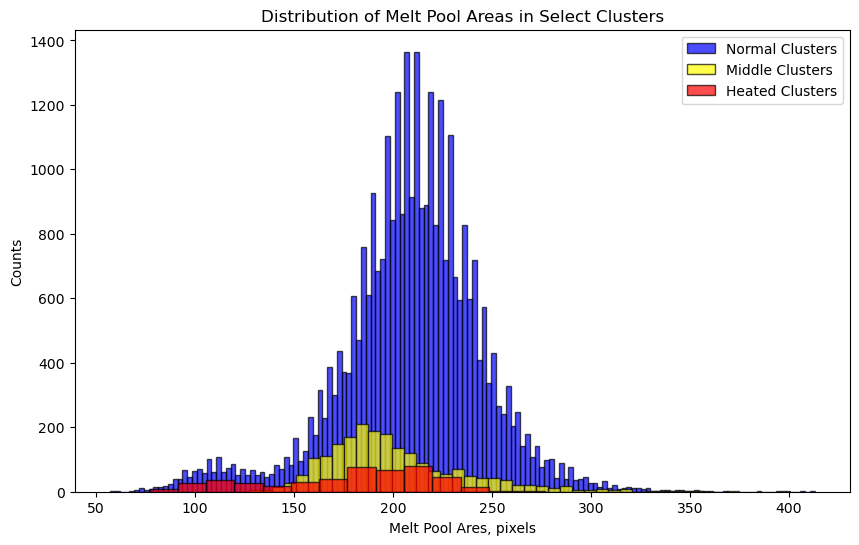

In [13]:
import matplotlib.pyplot as plt

# Define the clusters of interest
clusters_normal = [0, 2, 4, 5, 7, 8, 9, 12, 13, 14, 18, 19]
clusters_heated = [3, 10, 16]
clusters_middle = [1, 11, 15, 17]
clusters_empty = [6]

# Concatenate data for the specified clusters
selected_clusters_data = result_df[result_df['kmeans_20'].isin(clusters_normal)]
selected_clusters_heated = result_df[result_df['kmeans_20'].isin(clusters_heated)]
selected_clusters_middle = result_df[result_df['kmeans_20'].isin(clusters_middle)]

# Plot histogram for normal clusters
plt.figure(figsize=(10, 6))
plt.hist(selected_clusters_data['White Pixel Count'], bins='auto', edgecolor='black', color='blue', alpha=0.7, label='Normal Clusters')

# Plot histogram for heated clusters
plt.hist(selected_clusters_middle['White Pixel Count'].loc[0:selected_clusters_middle.shape[0]*0.8], bins='auto', edgecolor='black', color='yellow', alpha=0.7, label='Middle Clusters')

# Plot histogram for heated clusters
plt.hist(selected_clusters_heated['White Pixel Count'].loc[0:selected_clusters_heated.shape[0]*0.7], bins='auto', edgecolor='black', color='red', alpha=0.7, label='Heated Clusters')

# Set labels and title
plt.xlabel('Melt Pool Ares, pixels')
plt.ylabel('Counts')
plt.title('Distribution of Melt Pool Areas in Select Clusters')
plt.legend()
plt.savefig('Distribution of Melt Pool Areas in Select Clusters.pdf')
plt.show()


In [44]:
selected_clusters_data.sample(frac=1.4, replace=True, random_state=42)['layer']

36597     6
24521     8
1345     25
8443      2
46209    10
         ..
34287    16
21628    20
18471     1
6648     26
34525    22
Name: layer, Length: 45168, dtype: int64

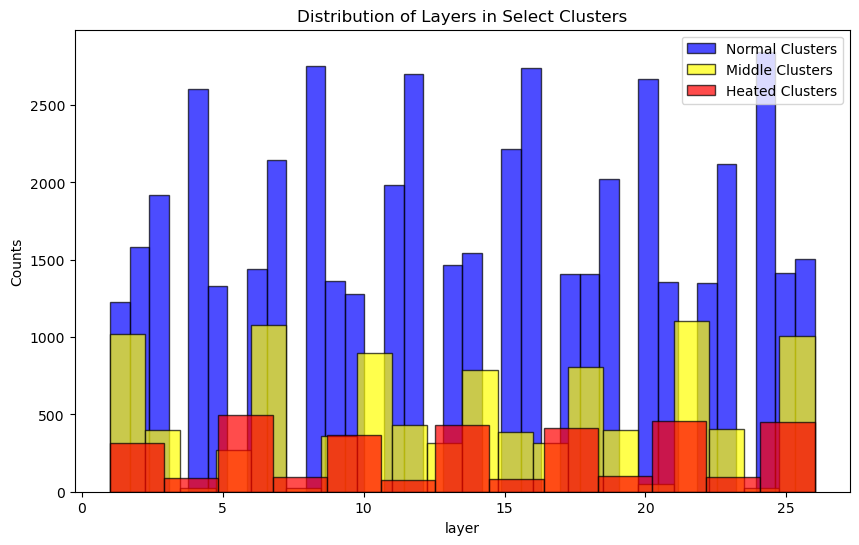

In [52]:
import matplotlib.pyplot as plt

# Define the clusters of interest
clusters_normal = [0, 2, 4, 5, 7, 8, 9, 12, 13, 14, 18, 19]
clusters_heated = [3, 10, 16]
clusters_middle = [1, 11, 15, 17]
clusters_empty = [6]

# Concatenate data for the specified clusters
selected_clusters_data = result_df[result_df['kmeans_20'].isin(clusters_normal)]
selected_clusters_heated = result_df[result_df['kmeans_20'].isin(clusters_heated)]
selected_clusters_middle = result_df[result_df['kmeans_20'].isin(clusters_middle)]

# Plot histogram for normal clusters
plt.figure(figsize=(10, 6))
plt.hist(selected_clusters_data.sample(frac=1.5, replace=True, random_state=42)['layer'], bins='auto', edgecolor='black', color='blue', alpha=0.7, label='Normal Clusters')

# Plot histogram for heated clusters
plt.hist(selected_clusters_middle.sample(frac=0.9, random_state=42)['layer'], bins='auto', edgecolor='black', color='yellow', alpha=0.7, label='Middle Clusters')

# Plot histogram for heated clusters
plt.hist(selected_clusters_heated.sample(frac=0.6, random_state=42)['layer'], bins='auto', edgecolor='black', color='red', alpha=0.7, label='Heated Clusters')


# Set labels and title
plt.xlabel('layer')
plt.ylabel('Counts')
plt.title('Distribution of Layers in Select Clusters')
plt.legend()
plt.savefig('Distribution of Layers in Select Clusters.pdf')
plt.show()

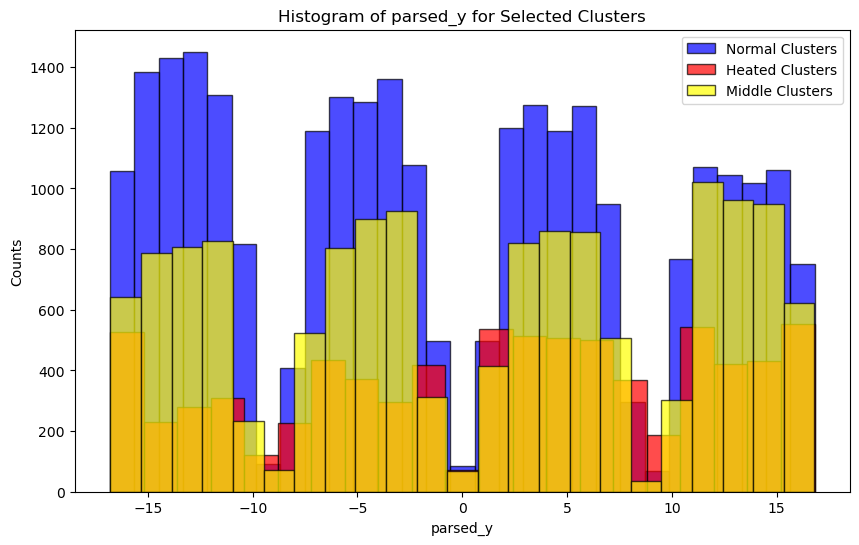

In [5]:
import matplotlib.pyplot as plt

col = 'parsed_y'
# Define the clusters of interest
clusters_normal = [0, 2, 5, 7, 8, 9, 12, 13, 14, 18]
clusters_heated = [3, 10, 16, 19]
clusters_middle = [1, 4, 11, 15, 17]
clusters_empty = [6]

# Concatenate data for the specified clusters
selected_clusters_data = result_df[result_df['kmeans_20'].isin(clusters_normal)]
selected_clusters_heated = result_df[result_df['kmeans_20'].isin(clusters_heated)]
selected_clusters_middle = result_df[result_df['kmeans_20'].isin(clusters_middle)]

# Plot histogram for normal clusters
plt.figure(figsize=(10, 6))
plt.hist(selected_clusters_data[col], bins='auto', edgecolor='black', color='blue', alpha=0.7, label='Normal Clusters')

# Plot histogram for heated clusters
plt.hist(selected_clusters_heated[col], bins='auto', edgecolor='black', color='red', alpha=0.7, label='Heated Clusters')

# Plot histogram for heated clusters
plt.hist(selected_clusters_middle[col], bins='auto', edgecolor='black', color='yellow', alpha=0.7, label='Middle Clusters')

# Set labels and title
plt.xlabel(f'{col}')
plt.ylabel('Counts')
plt.title(f'Histogram of {col} for Selected Clusters')
plt.legend()
plt.show()

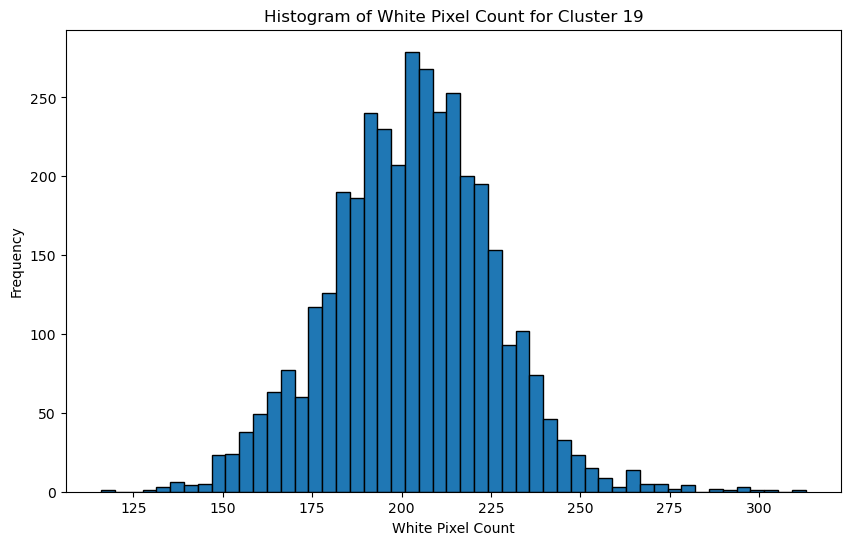

In [5]:
import matplotlib.pyplot as plt
# Filter data for Cluster 19
cluster_19_data = result_df[result_df['kmeans_20'] == 10]

# Plot histogram
plt.figure(figsize=(10, 6))
plt.hist(cluster_19_data['White Pixel Count'], bins='auto', edgecolor='black')
plt.xlabel('White Pixel Count')
plt.ylabel('Frequency')
plt.title('Histogram of White Pixel Count for Cluster ??')
plt.show()

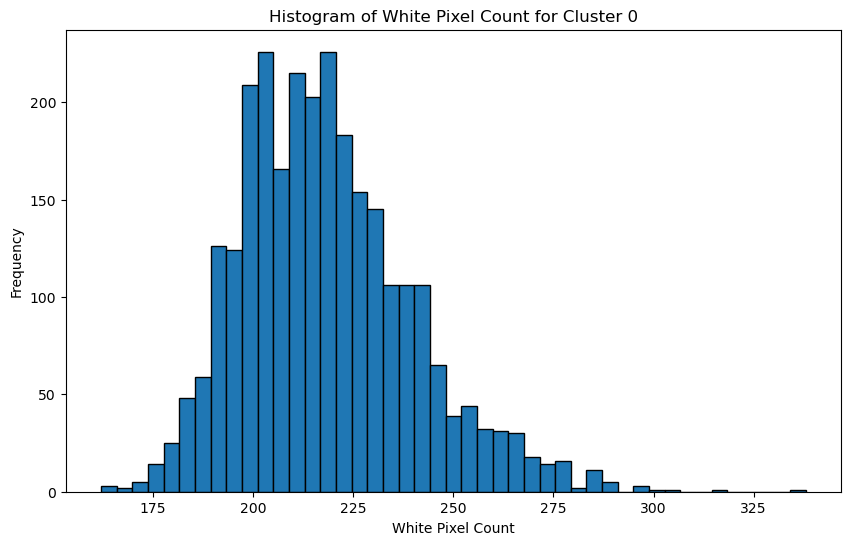

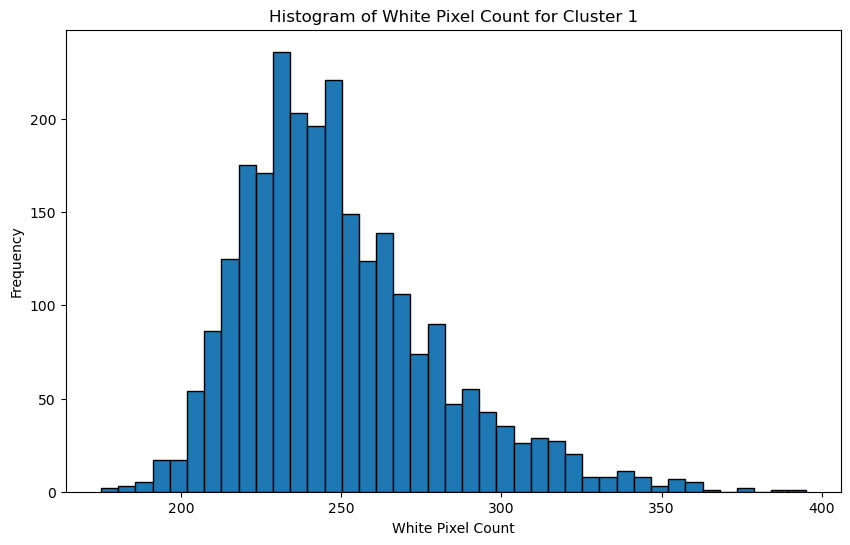

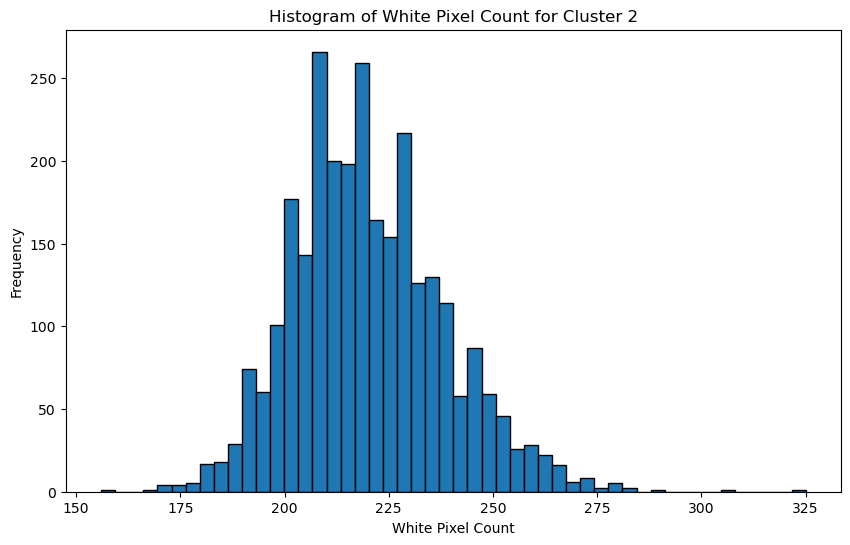

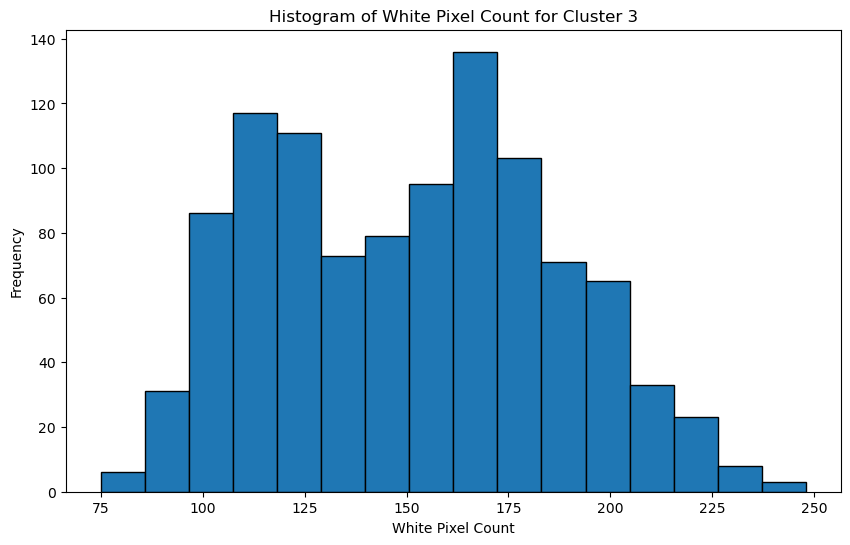

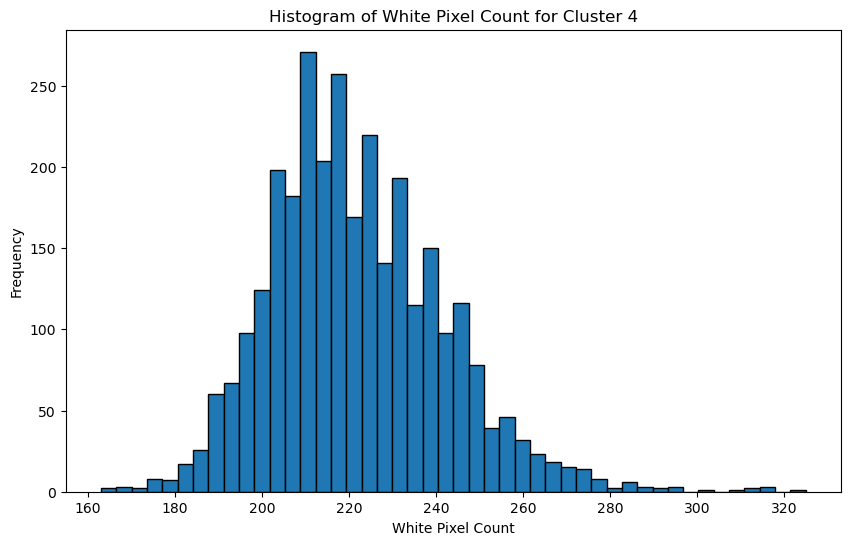

...

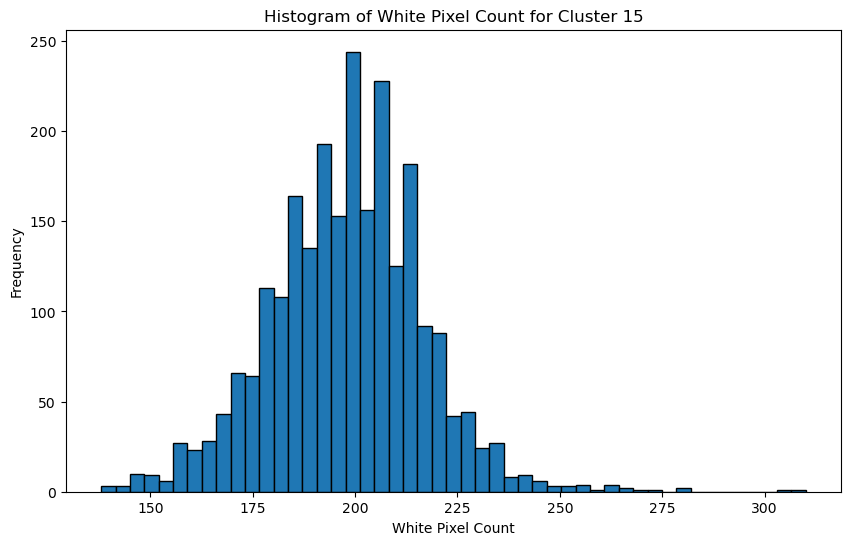

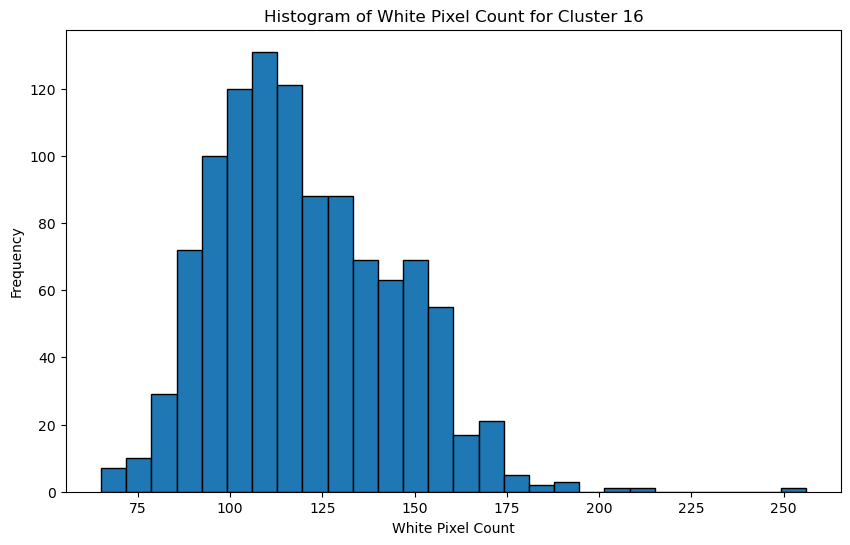

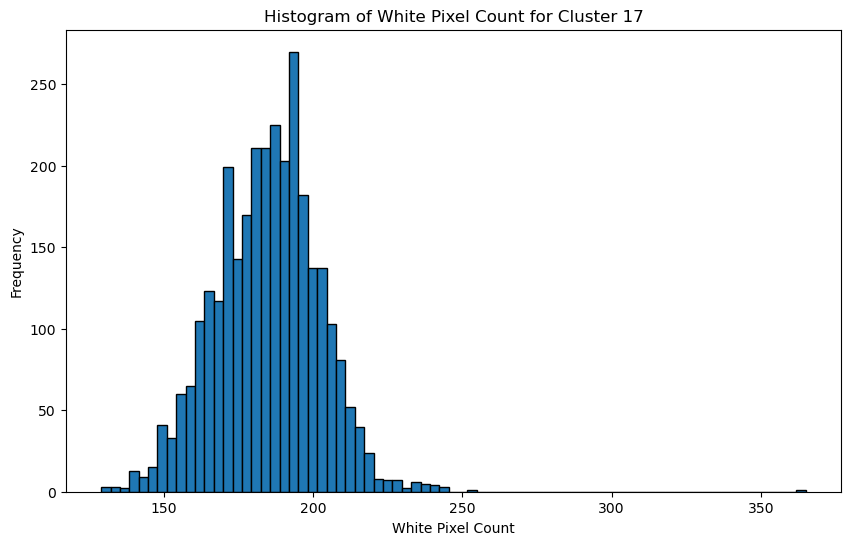

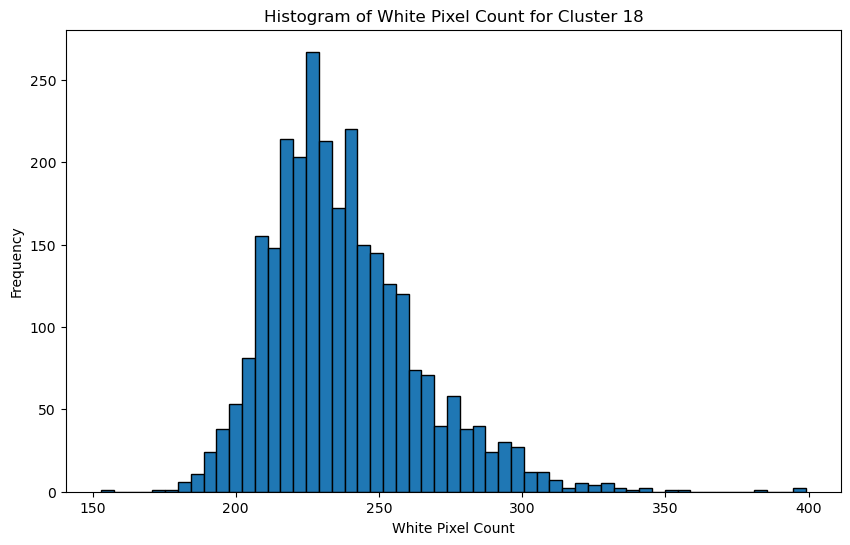

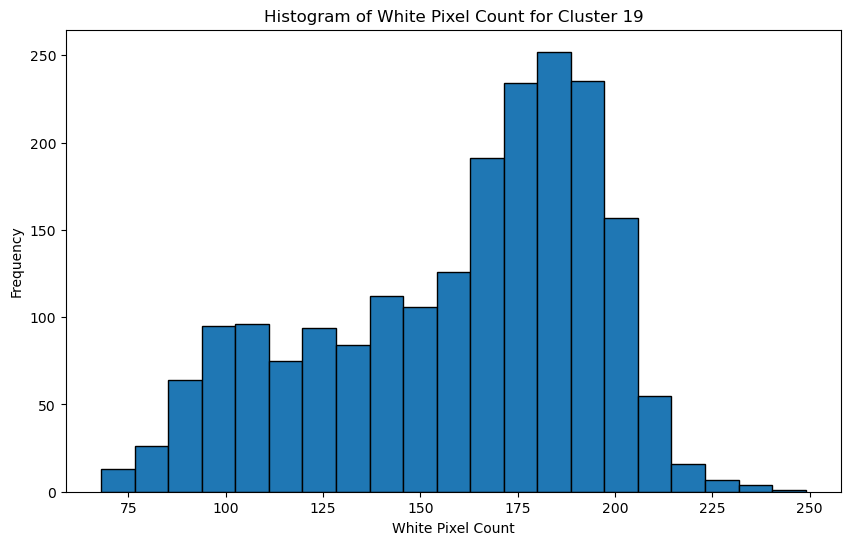

In [119]:
# Get unique clusters
unique_clusters = list(set(result_df['Cluster'].unique()))

# Plot histograms for each cluster
for cluster in unique_clusters:
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(cluster_data['White Pixel Count'], bins='auto', edgecolor='black')
    plt.xlabel('White Pixel Count')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of White Pixel Count for Cluster {cluster}')
    plt.show()

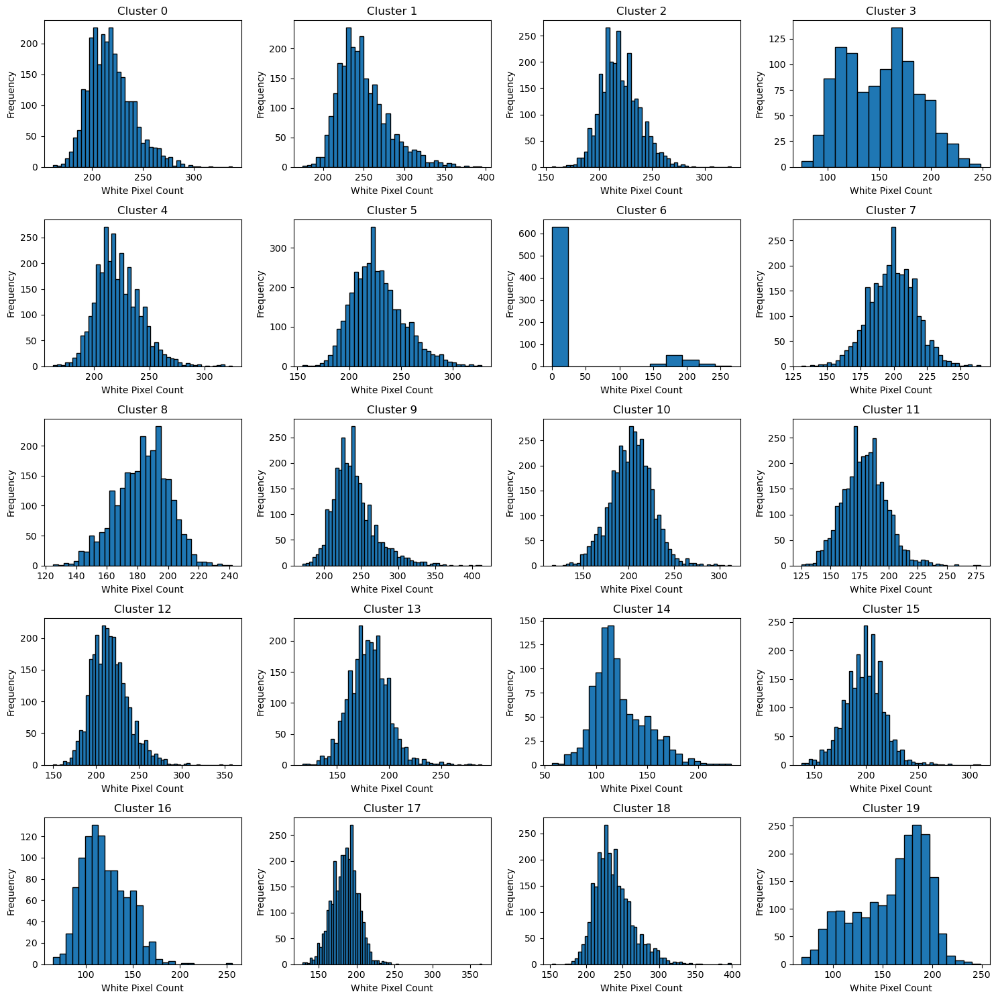

In [127]:
import math
# Calculate the number of rows and columns for subplots
num_clusters = len(unique_clusters)
num_rows = math.ceil(num_clusters / 4)
num_cols = min(4, num_clusters)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Plot histograms for each cluster
for i, cluster in enumerate(unique_clusters):
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    axes[i].hist(cluster_data['White Pixel Count'], bins='auto', edgecolor='black')
    axes[i].set_xlabel('White Pixel Count')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Cluster {cluster}')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

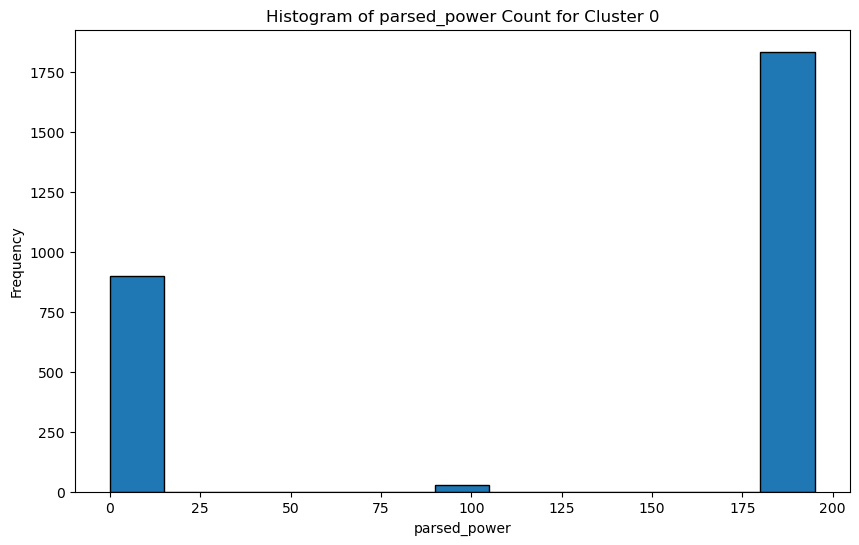

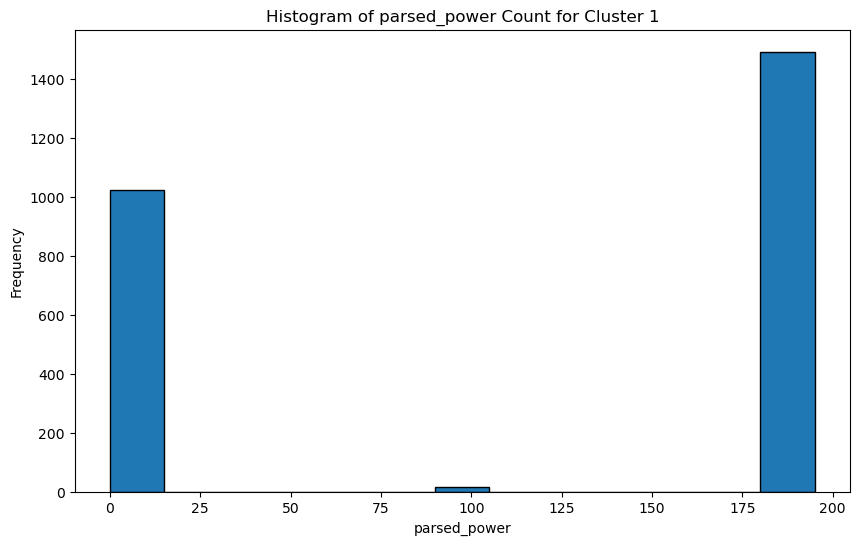

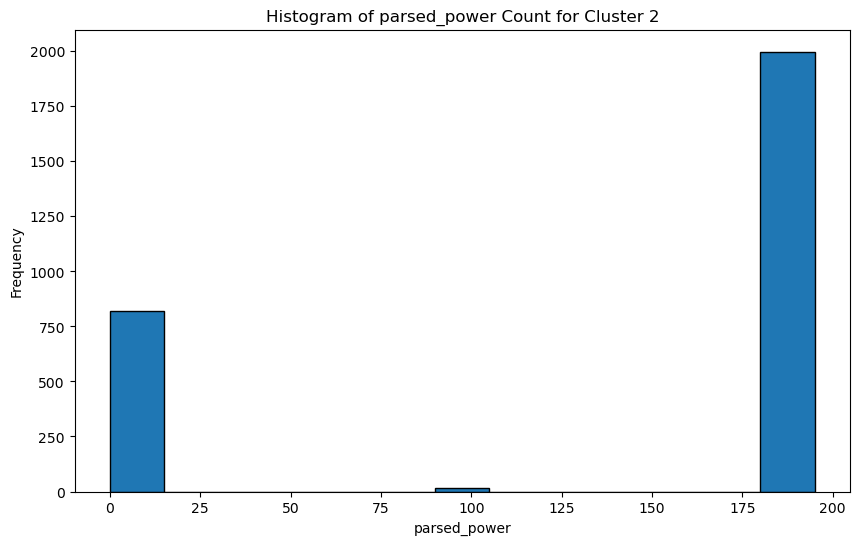

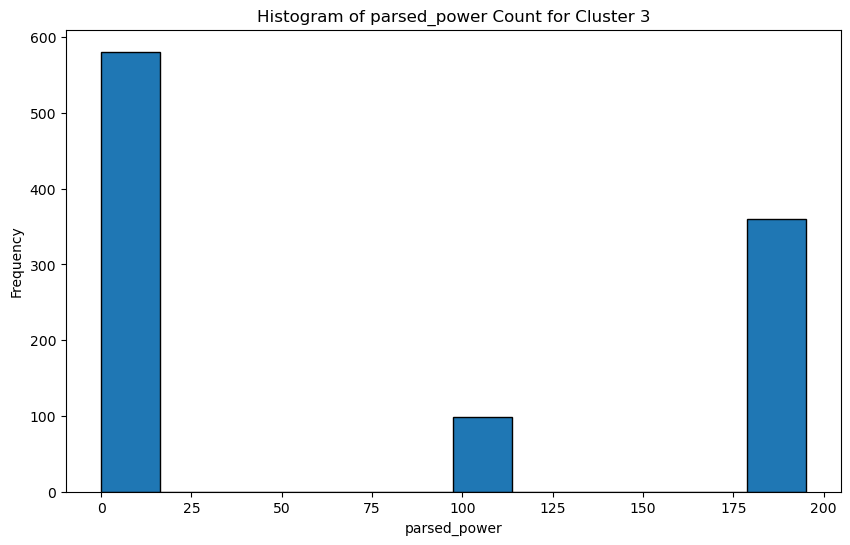

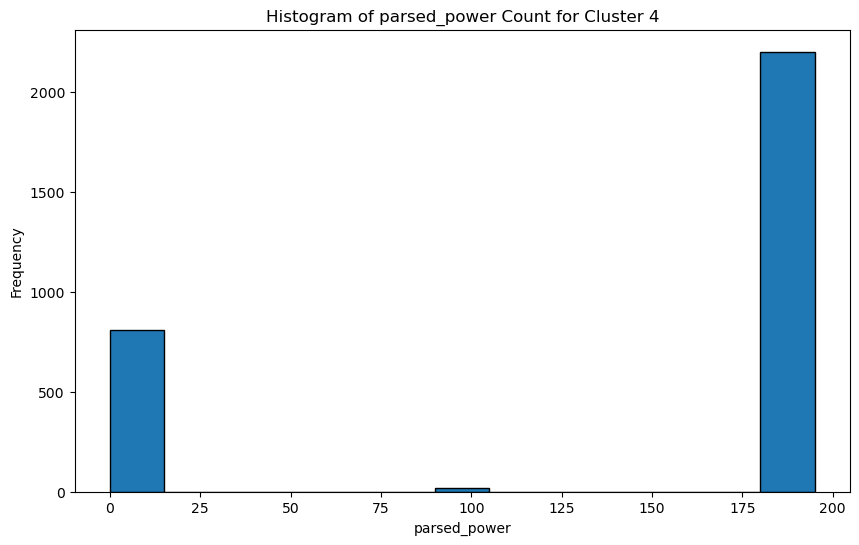

...

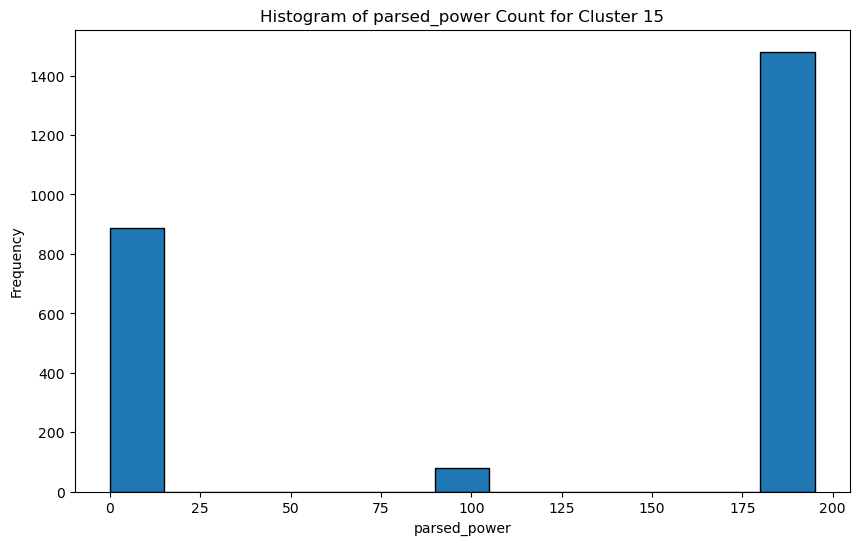

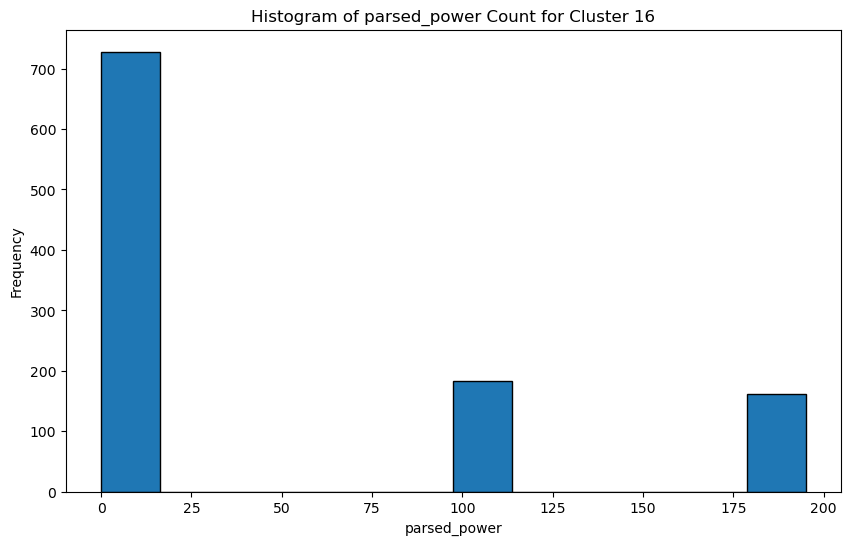

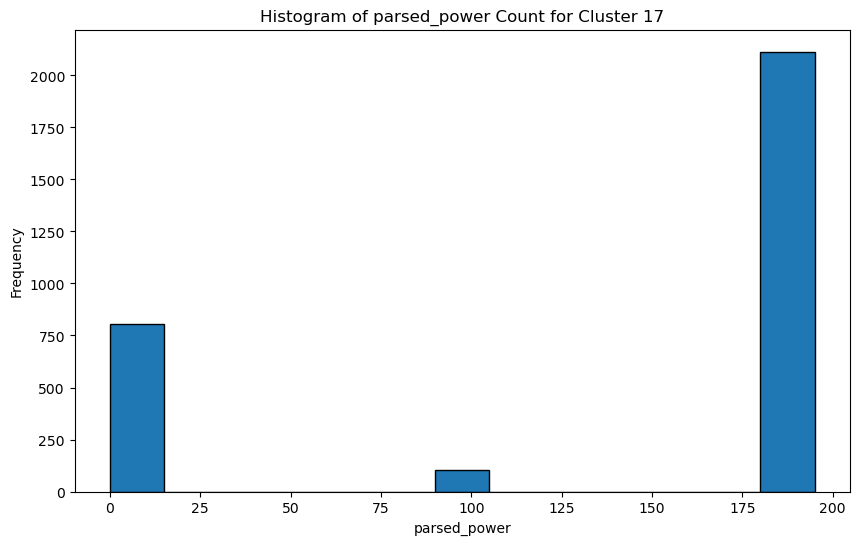

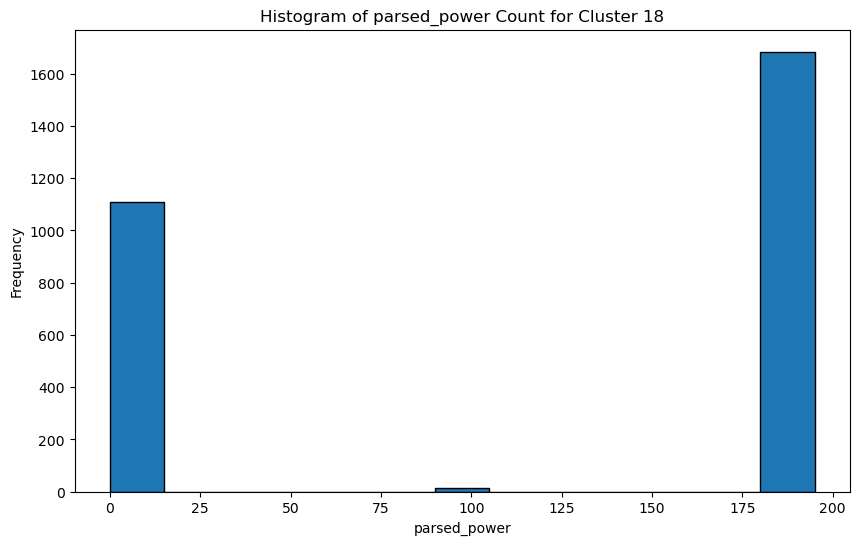

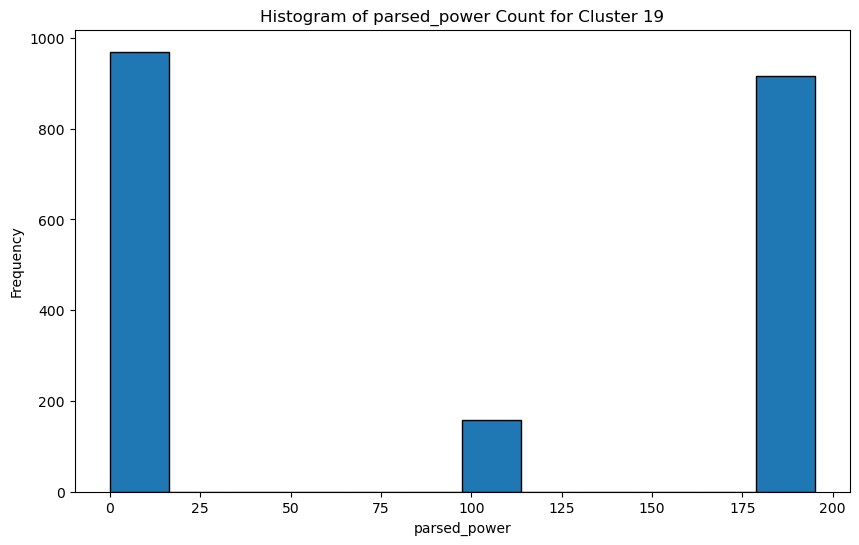

In [121]:
# Get unique clusters
unique_clusters = list(set(result_df['Cluster'].unique()))

# Plot histograms for each cluster
for cluster in unique_clusters:
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(cluster_data['parsed_power'], bins='auto', edgecolor='black')
    plt.xlabel('parsed_power')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of parsed_power Count for Cluster {cluster}')
    plt.show()

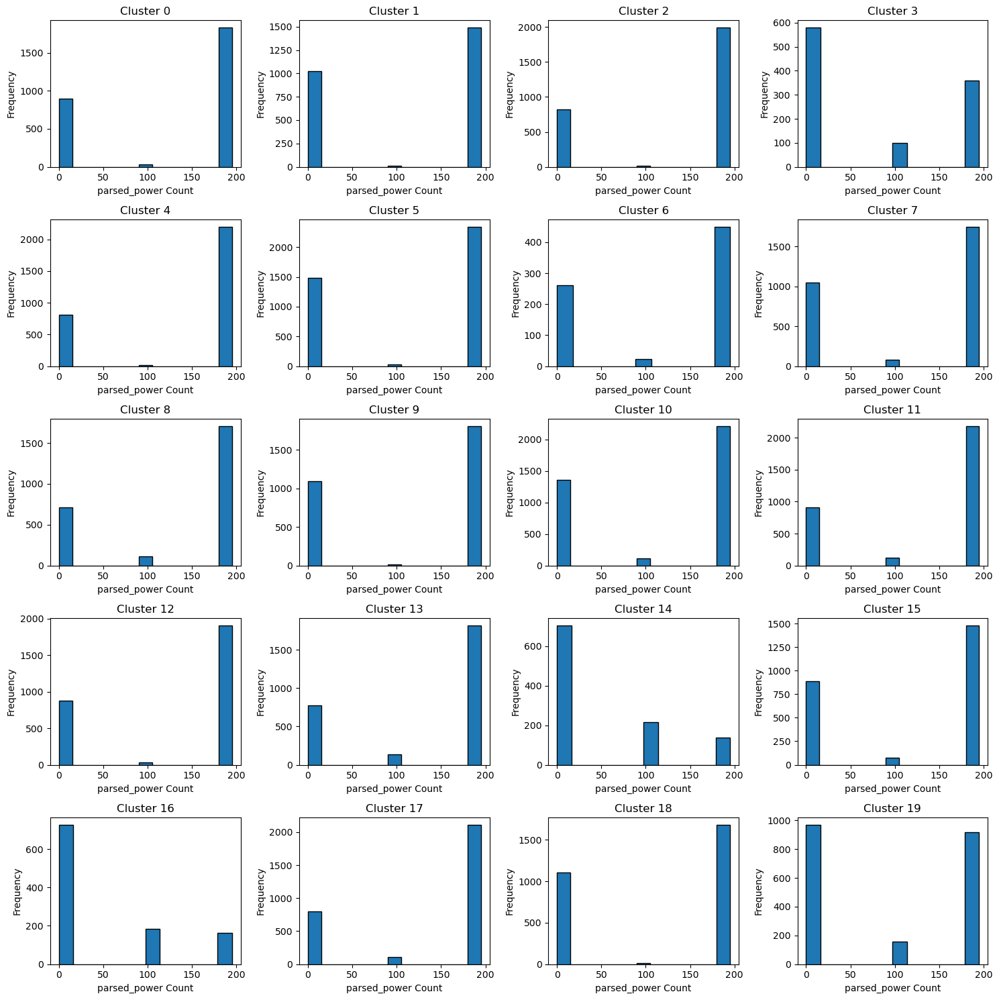

In [128]:
import math
# Calculate the number of rows and columns for subplots
num_clusters = len(unique_clusters)
num_rows = math.ceil(num_clusters / 4)
num_cols = min(4, num_clusters)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Plot histograms for each cluster
for i, cluster in enumerate(unique_clusters):
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    axes[i].hist(cluster_data['parsed_power'], bins='auto', edgecolor='black')
    axes[i].set_xlabel('parsed_power Count')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Cluster {cluster}')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

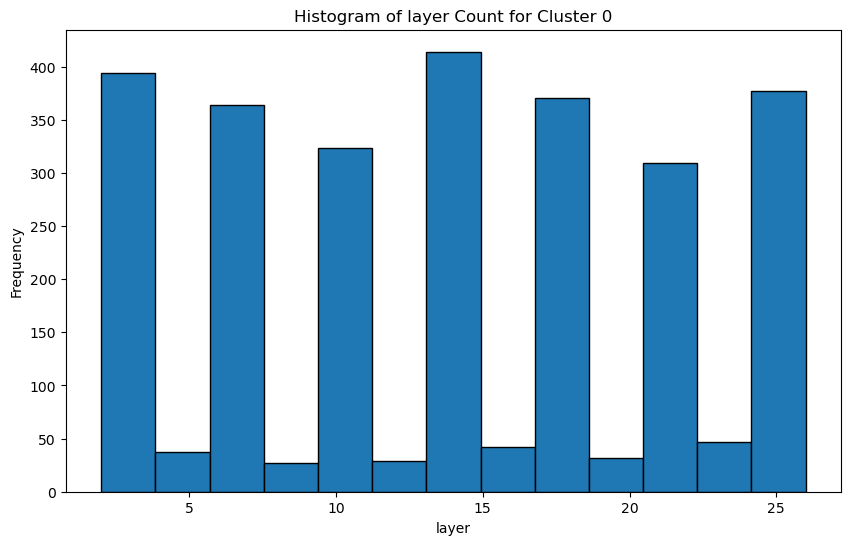

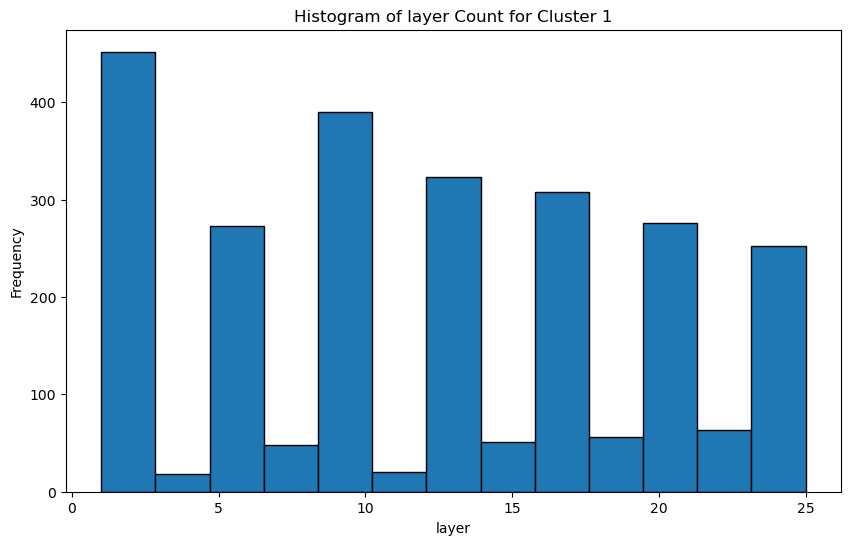

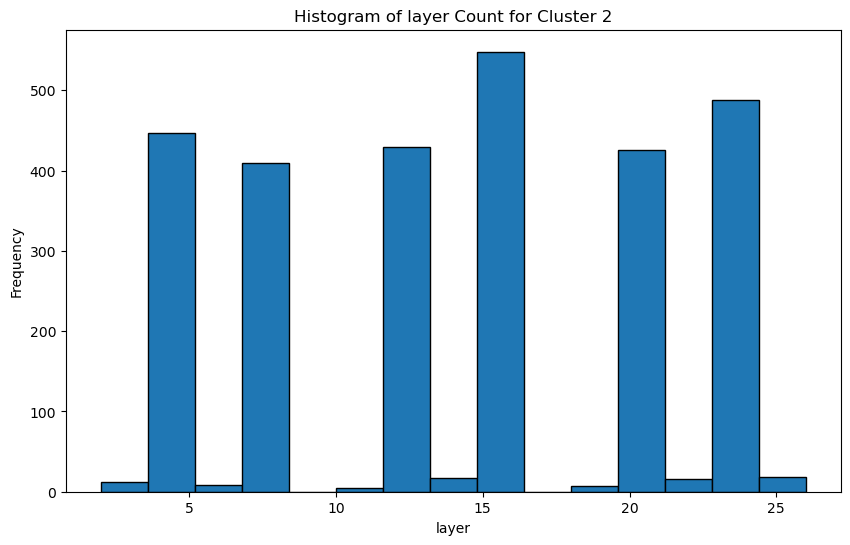

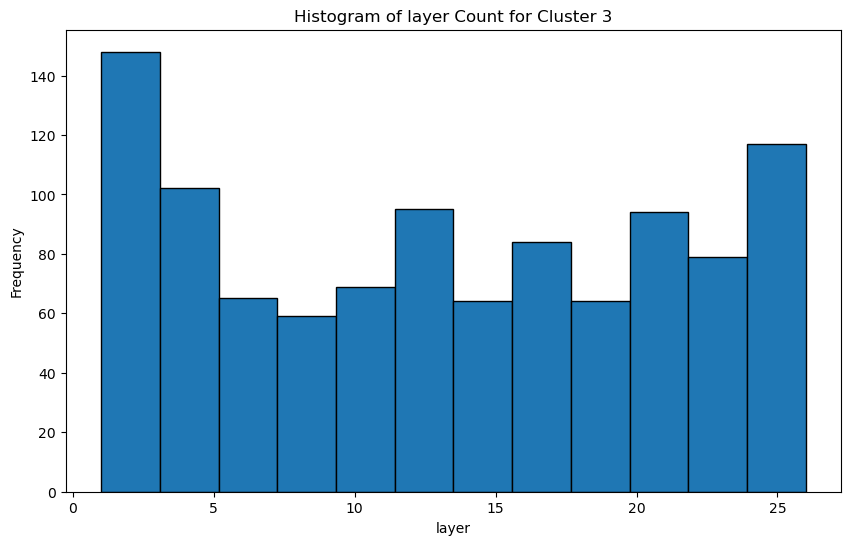

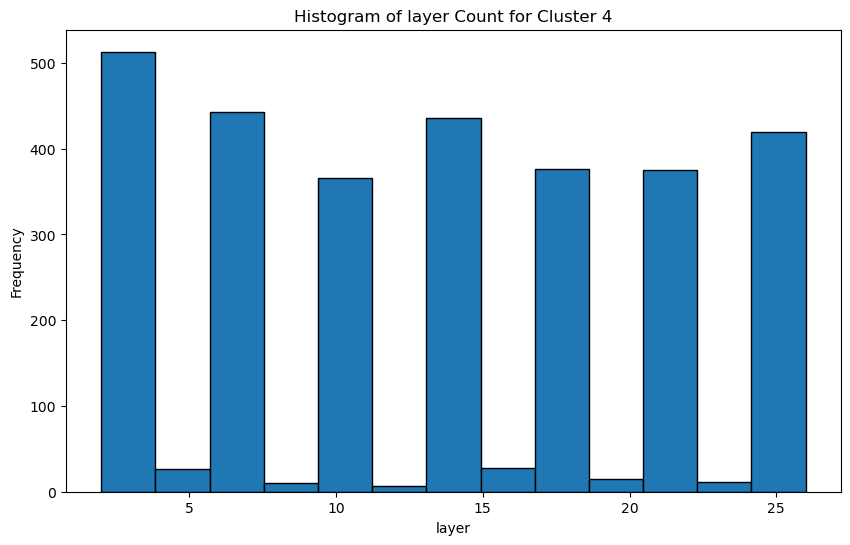

...

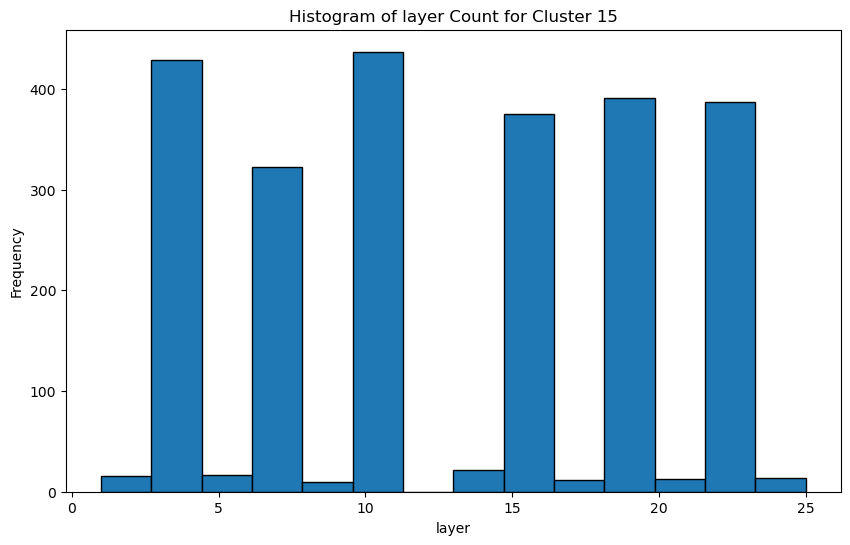

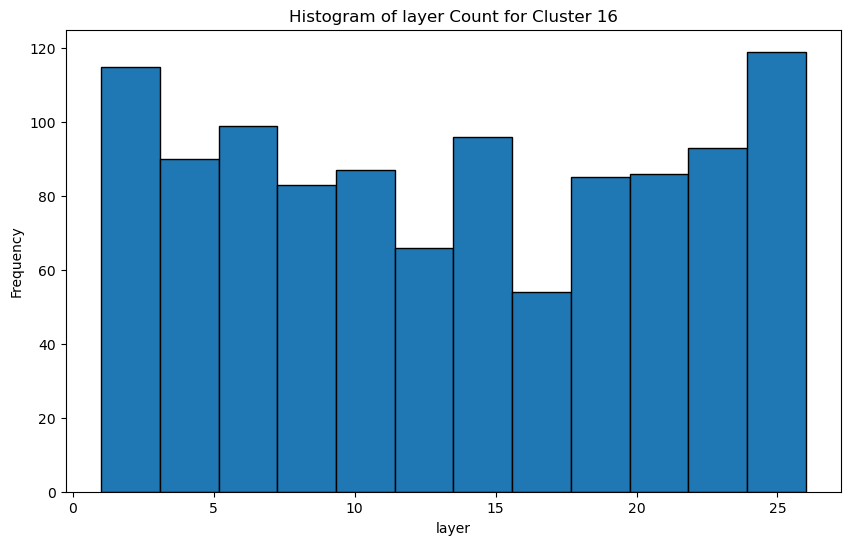

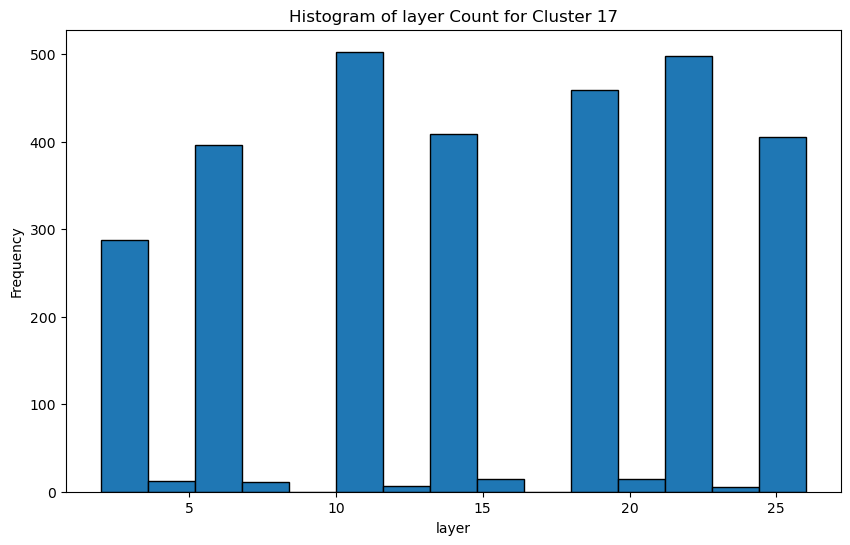

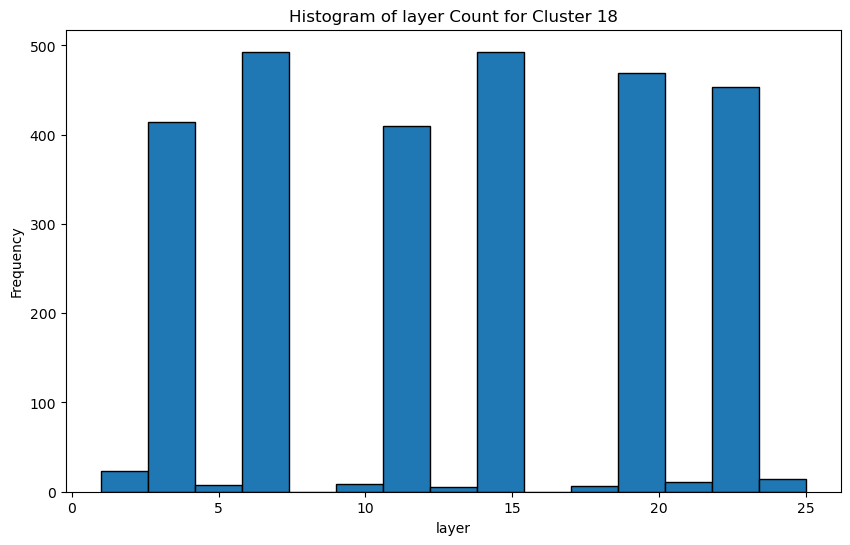

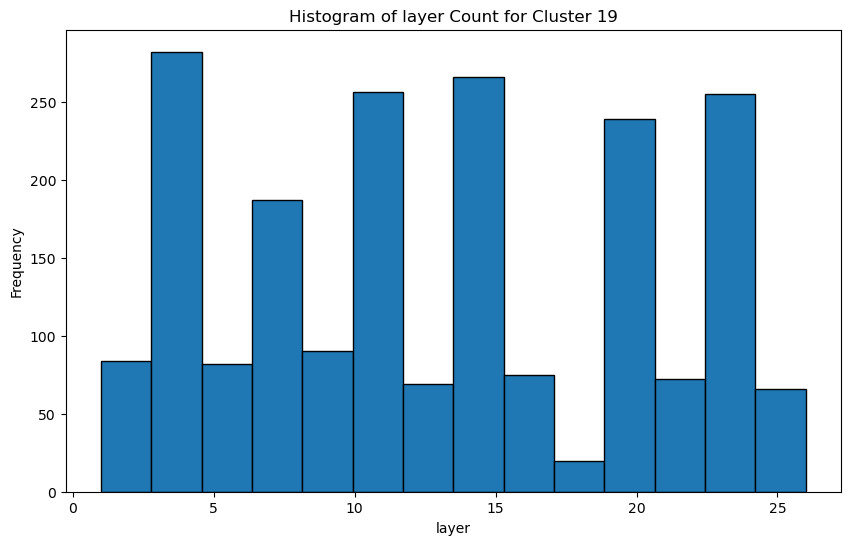

In [122]:
# Get unique clusters
unique_clusters = list(set(result_df['Cluster'].unique()))

# Plot histograms for each cluster
for cluster in unique_clusters:
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(cluster_data['layer'], bins='auto', edgecolor='black')
    plt.xlabel('layer')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of layer Count for Cluster {cluster}')
    plt.show()

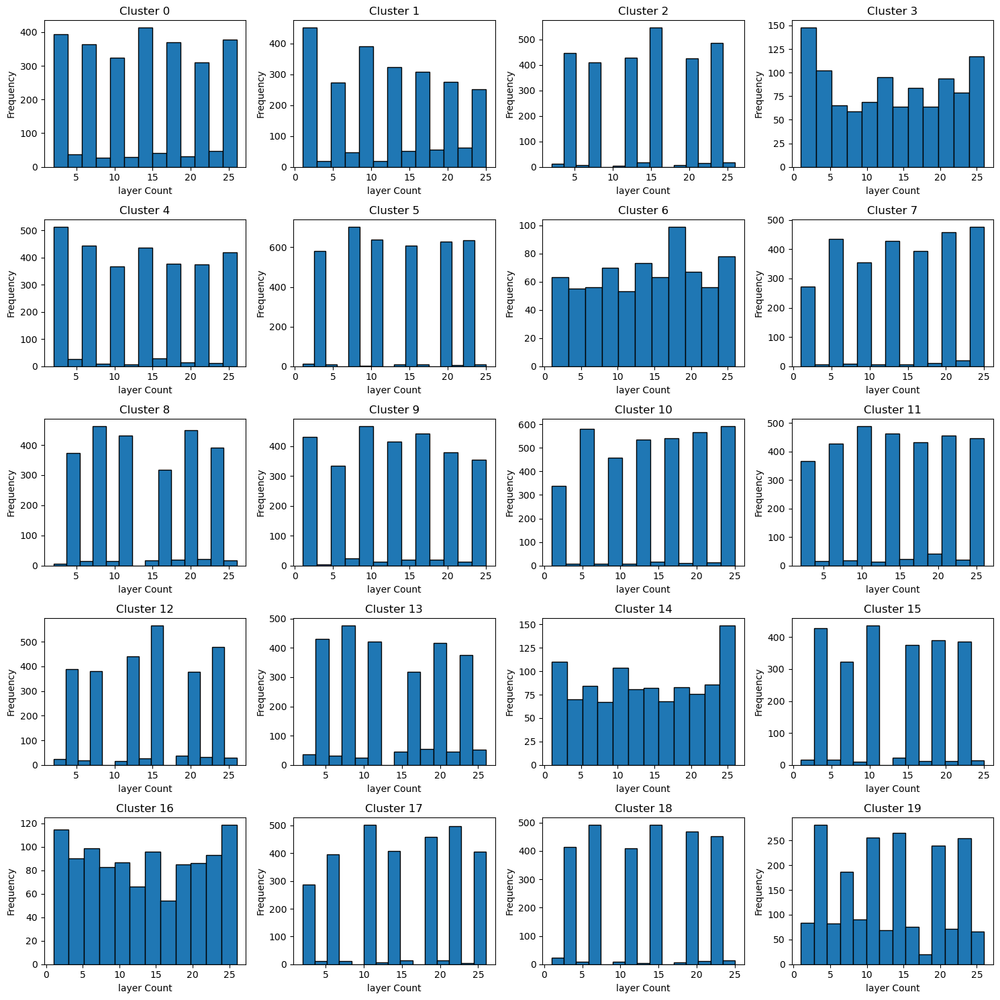

In [129]:
import math
# Calculate the number of rows and columns for subplots
num_clusters = len(unique_clusters)
num_rows = math.ceil(num_clusters / 4)
num_cols = min(4, num_clusters)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Plot histograms for each cluster
for i, cluster in enumerate(unique_clusters):
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    axes[i].hist(cluster_data['layer'], bins='auto', edgecolor='black')
    axes[i].set_xlabel('layer Count')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Cluster {cluster}')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

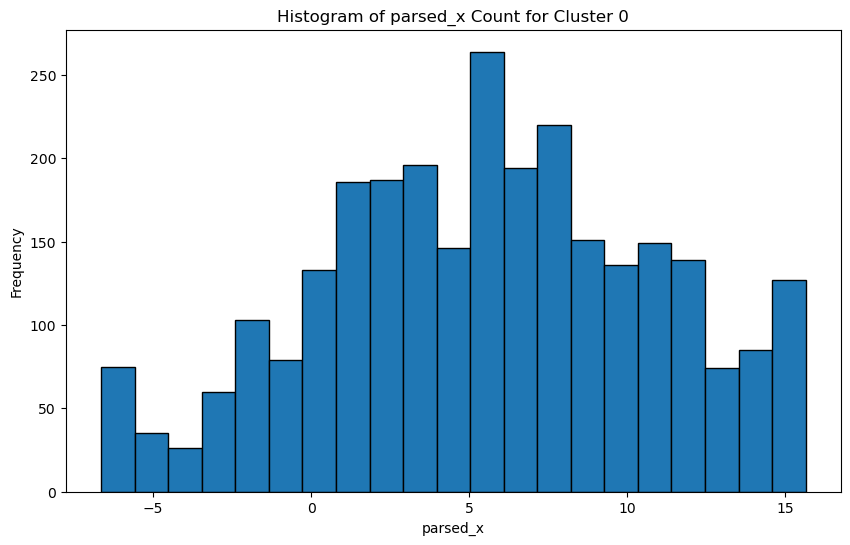

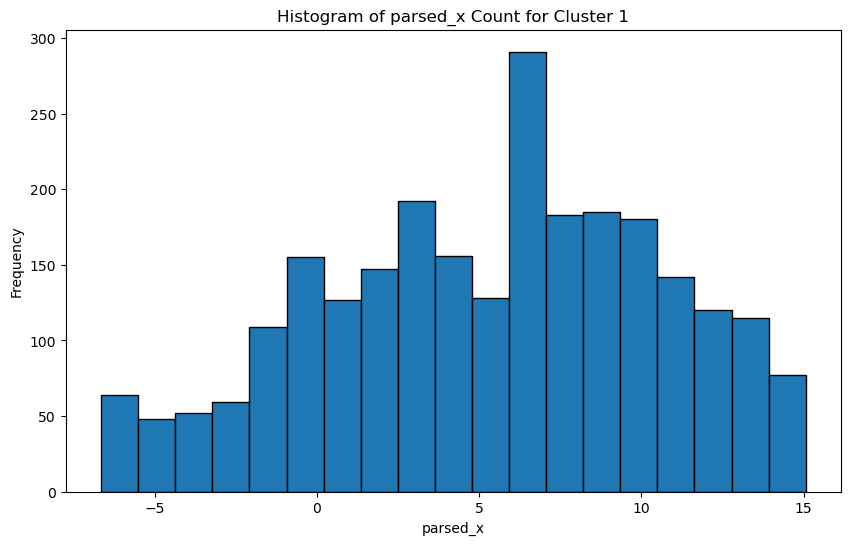

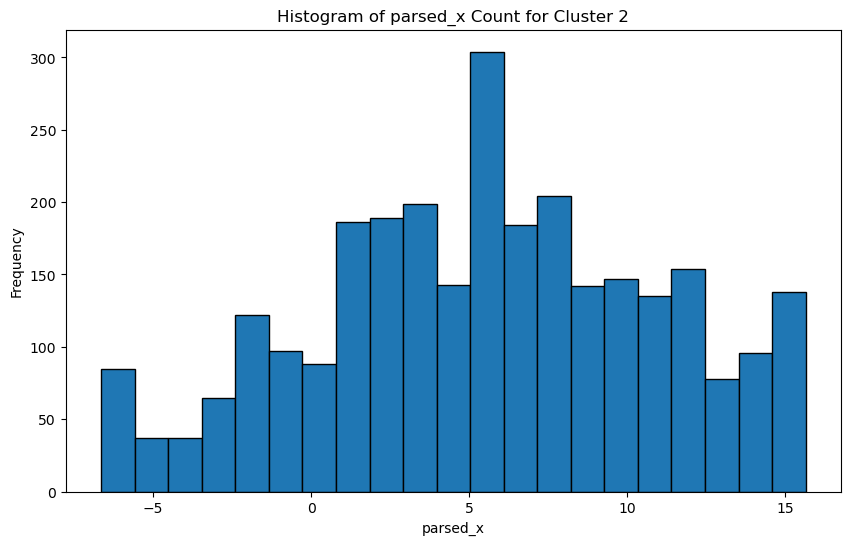

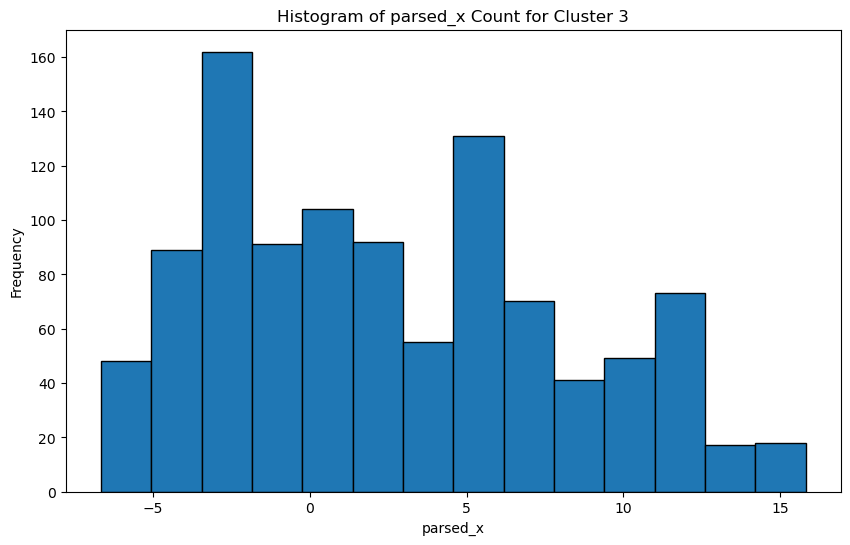

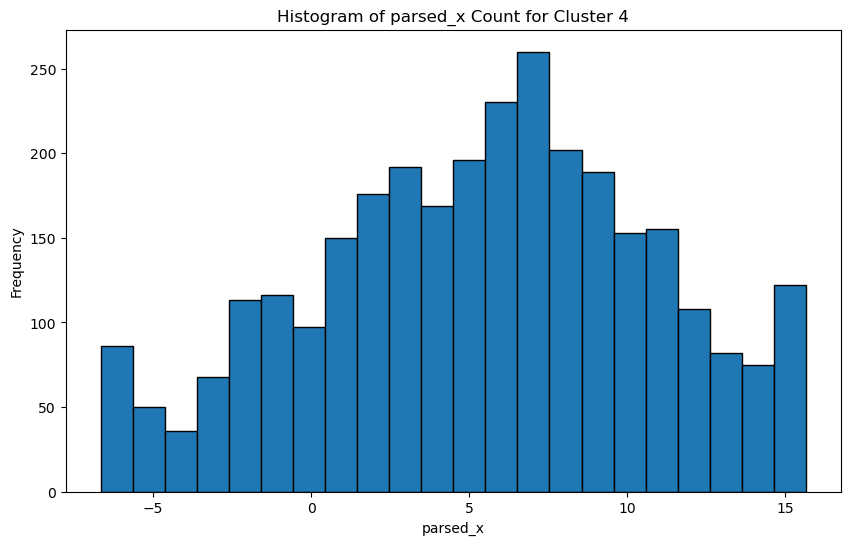

...

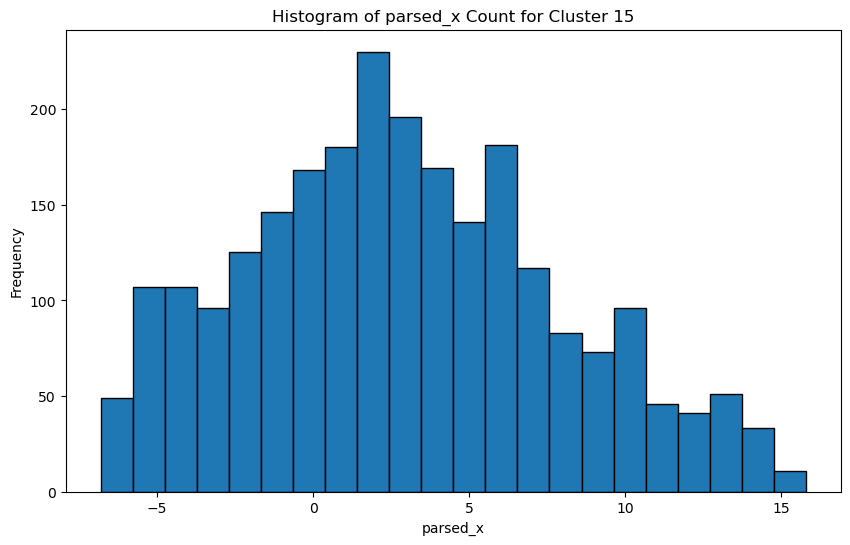

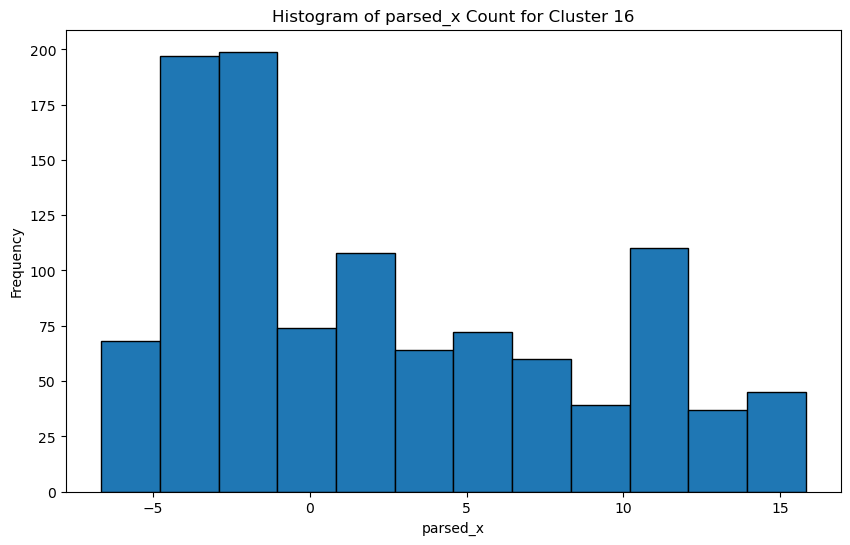

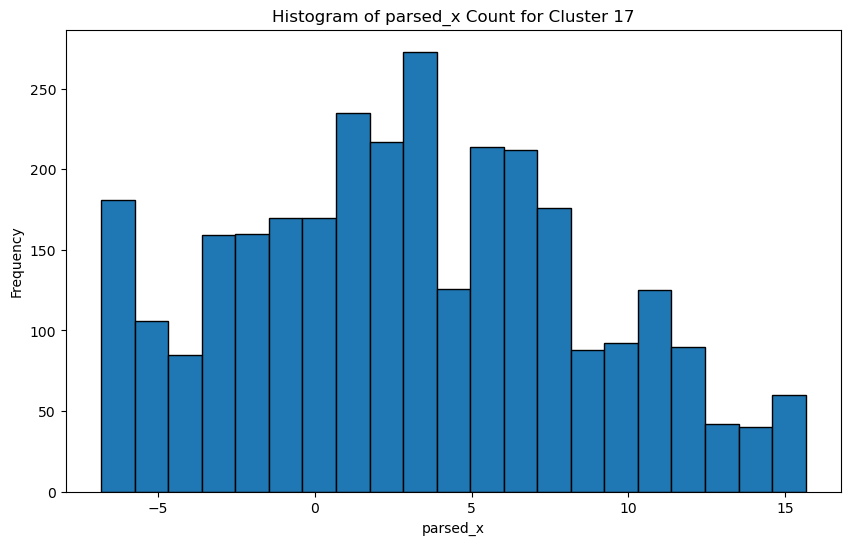

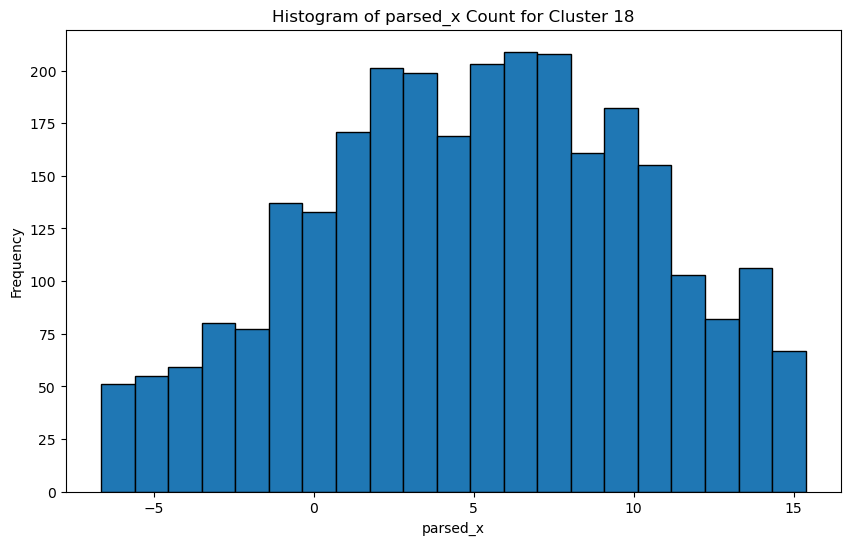

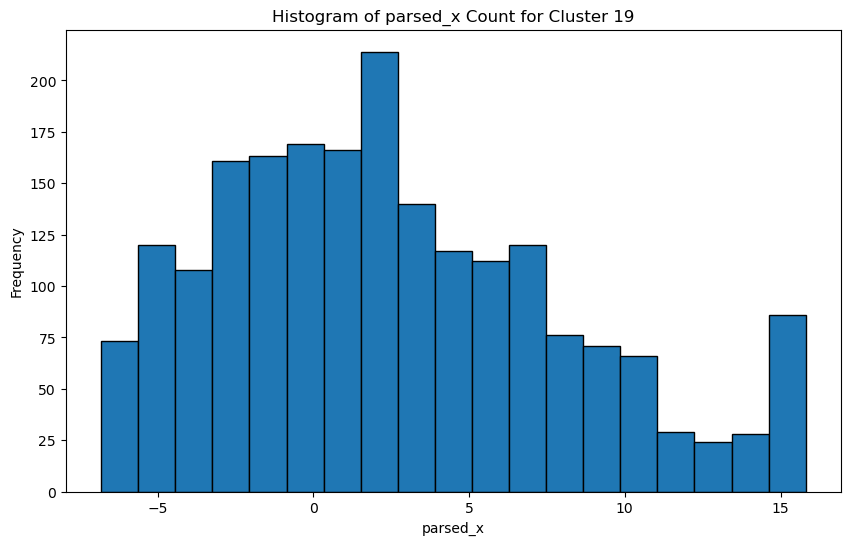

In [123]:
# Get unique clusters
unique_clusters = list(set(result_df['Cluster'].unique()))

# Plot histograms for each cluster
for cluster in unique_clusters:
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(cluster_data['parsed_x'], bins='auto', edgecolor='black')
    plt.xlabel('parsed_x')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of parsed_x Count for Cluster {cluster}')
    plt.show()

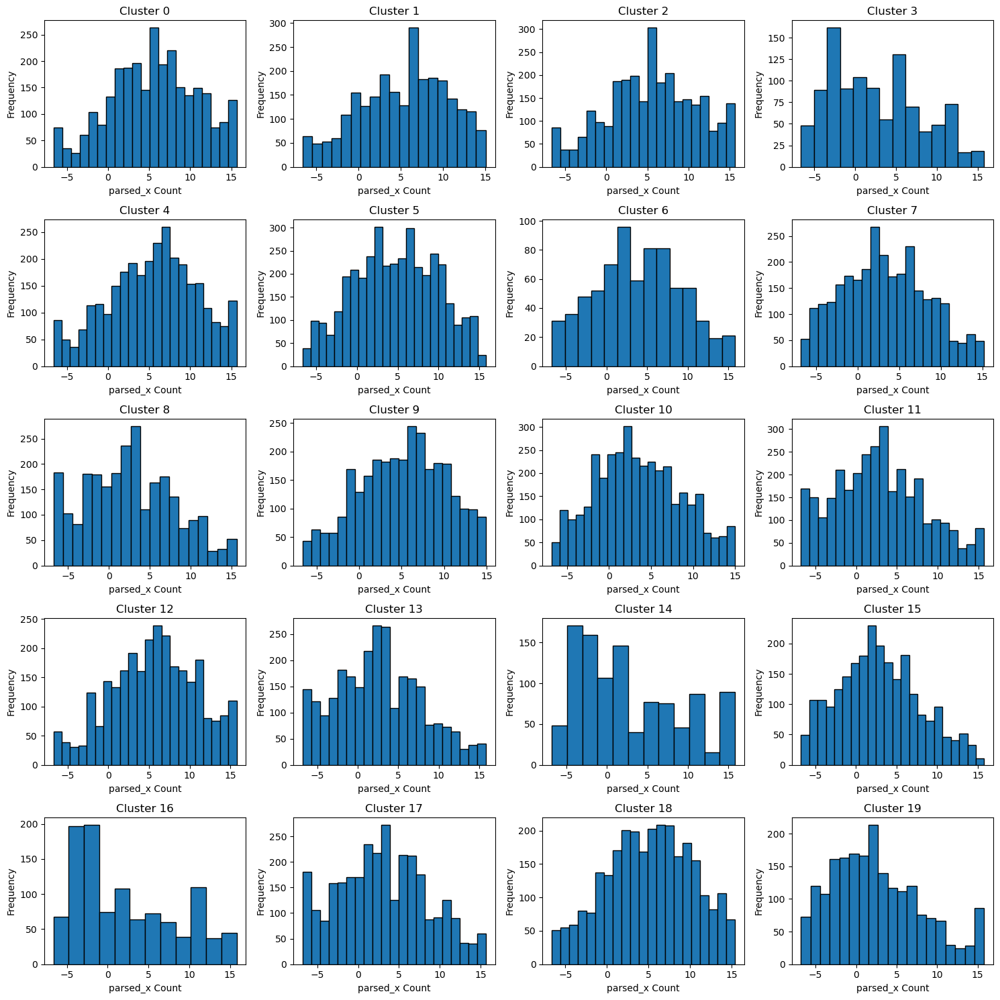

In [130]:
import math
# Calculate the number of rows and columns for subplots
num_clusters = len(unique_clusters)
num_rows = math.ceil(num_clusters / 4)
num_cols = min(4, num_clusters)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Plot histograms for each cluster
for i, cluster in enumerate(unique_clusters):
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    axes[i].hist(cluster_data['parsed_x'], bins='auto', edgecolor='black')
    axes[i].set_xlabel('parsed_x Count')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Cluster {cluster}')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

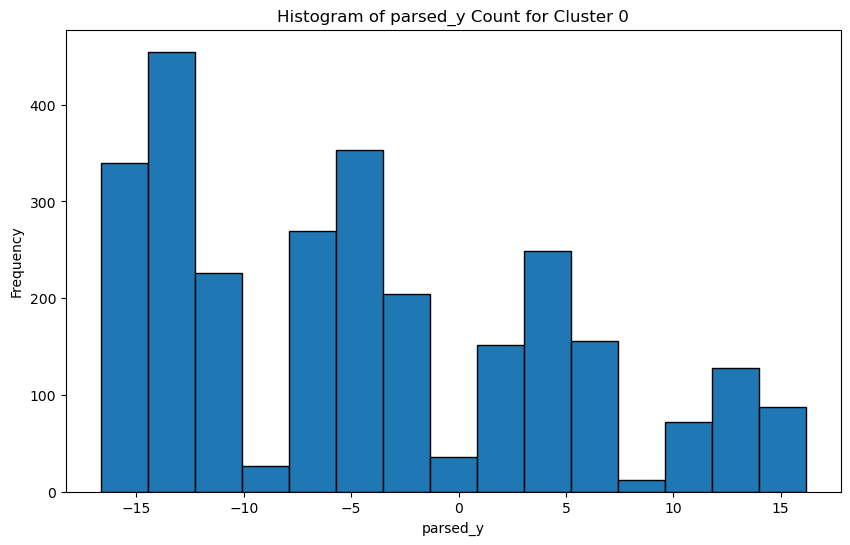

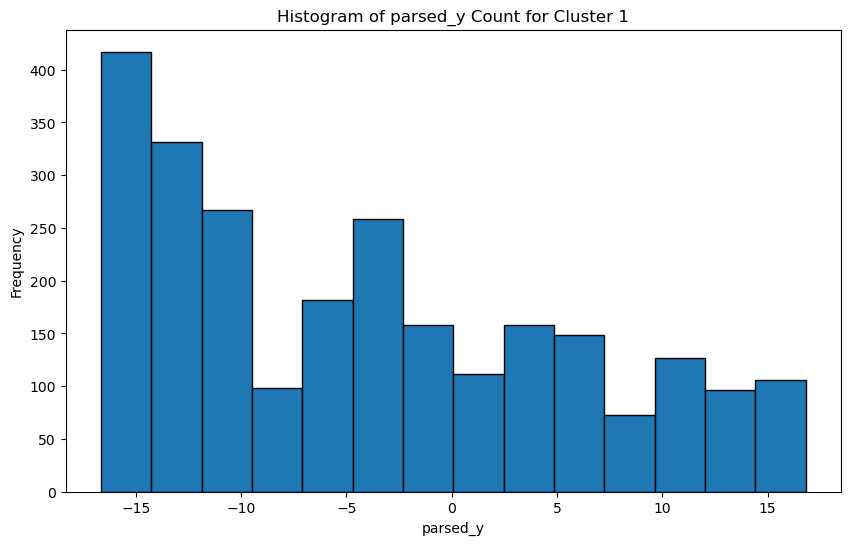

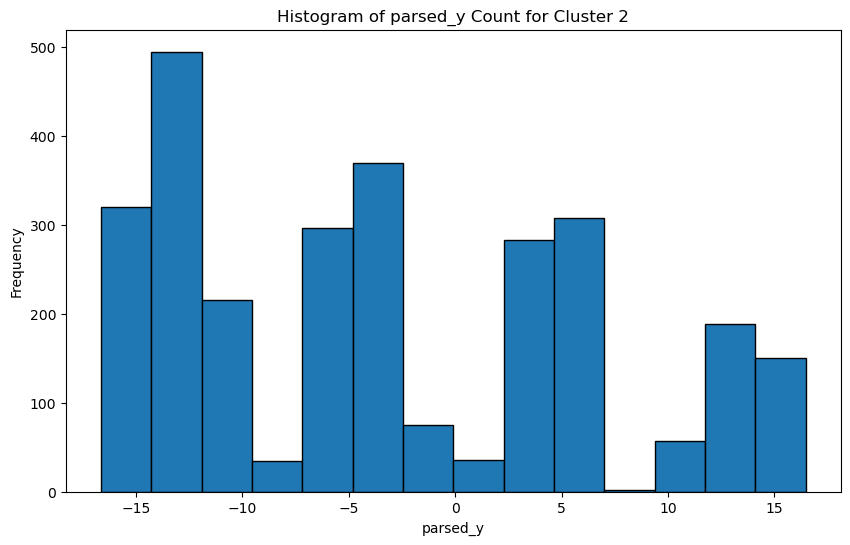

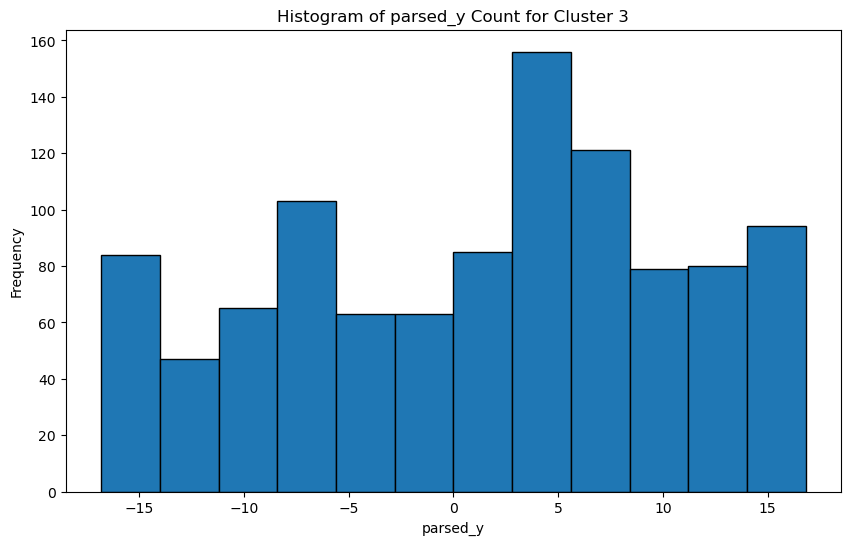

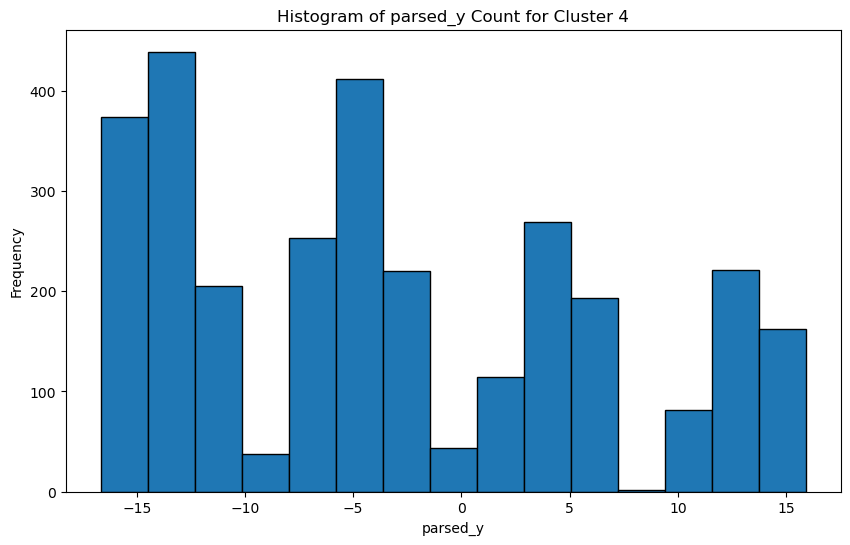

...

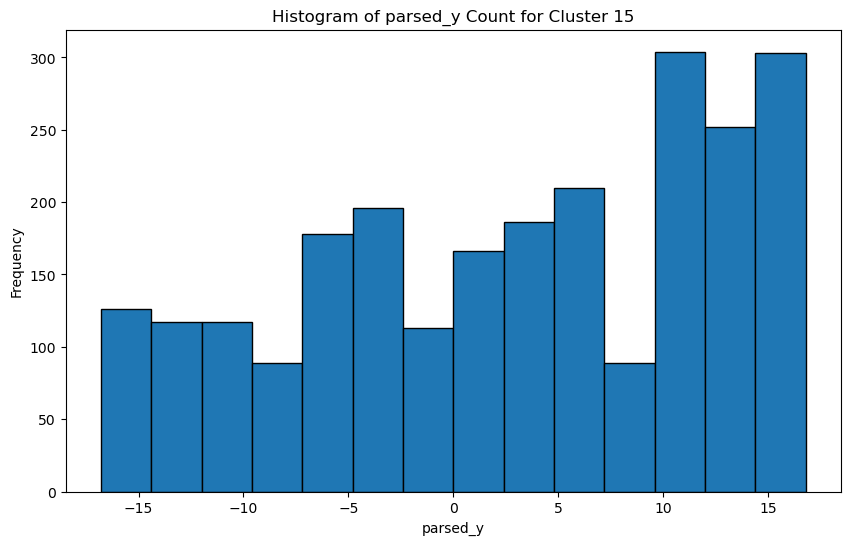

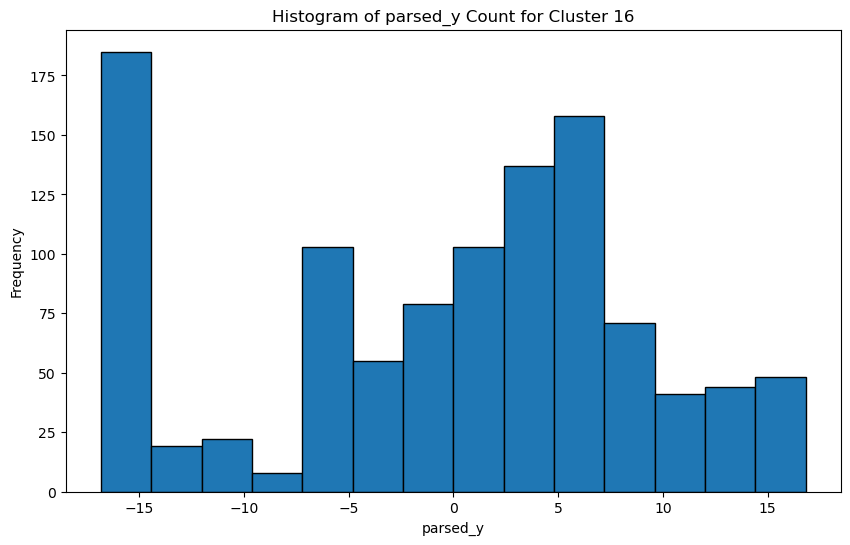

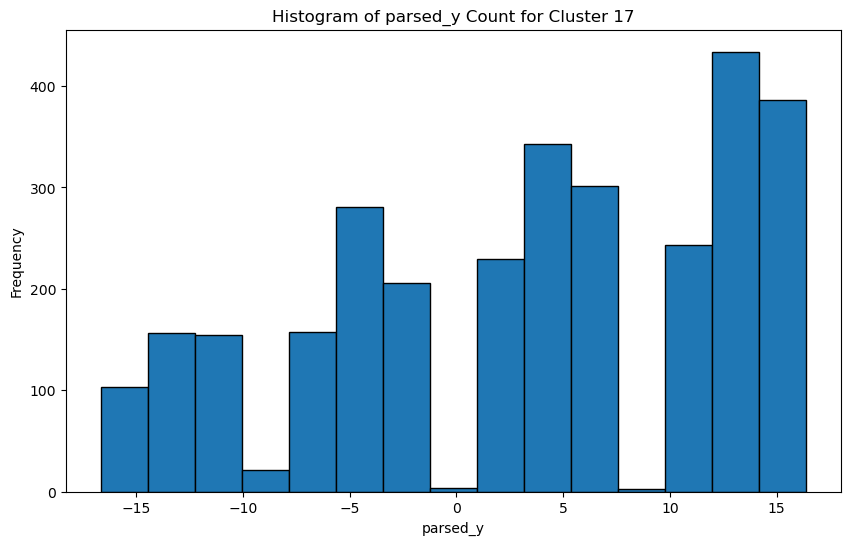

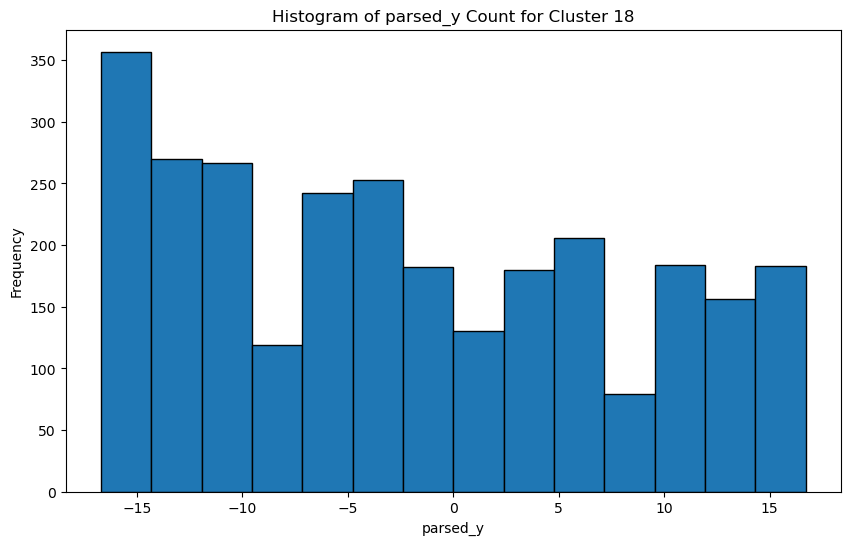

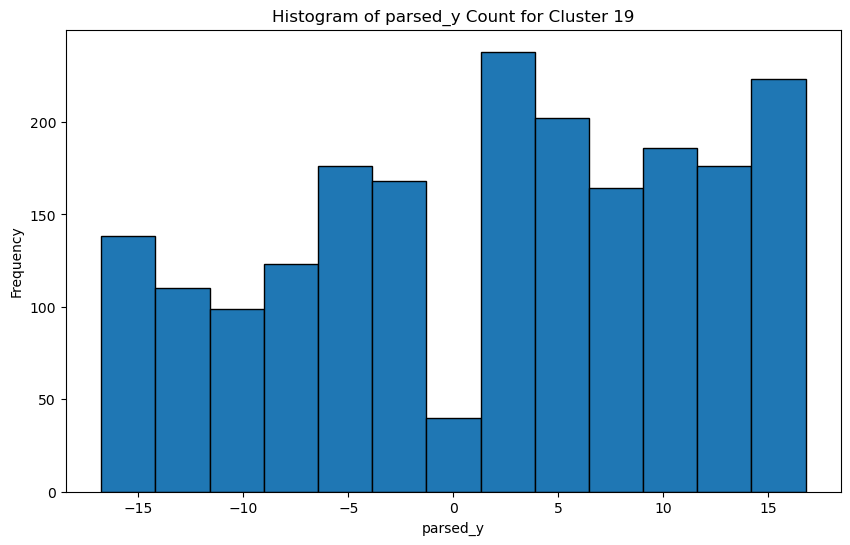

In [124]:
# Get unique clusters
unique_clusters = list(set(result_df['Cluster'].unique()))

# Plot histograms for each cluster
for cluster in unique_clusters:
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(cluster_data['parsed_y'], bins='auto', edgecolor='black')
    plt.xlabel('parsed_y')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of parsed_y Count for Cluster {cluster}')
    plt.show()

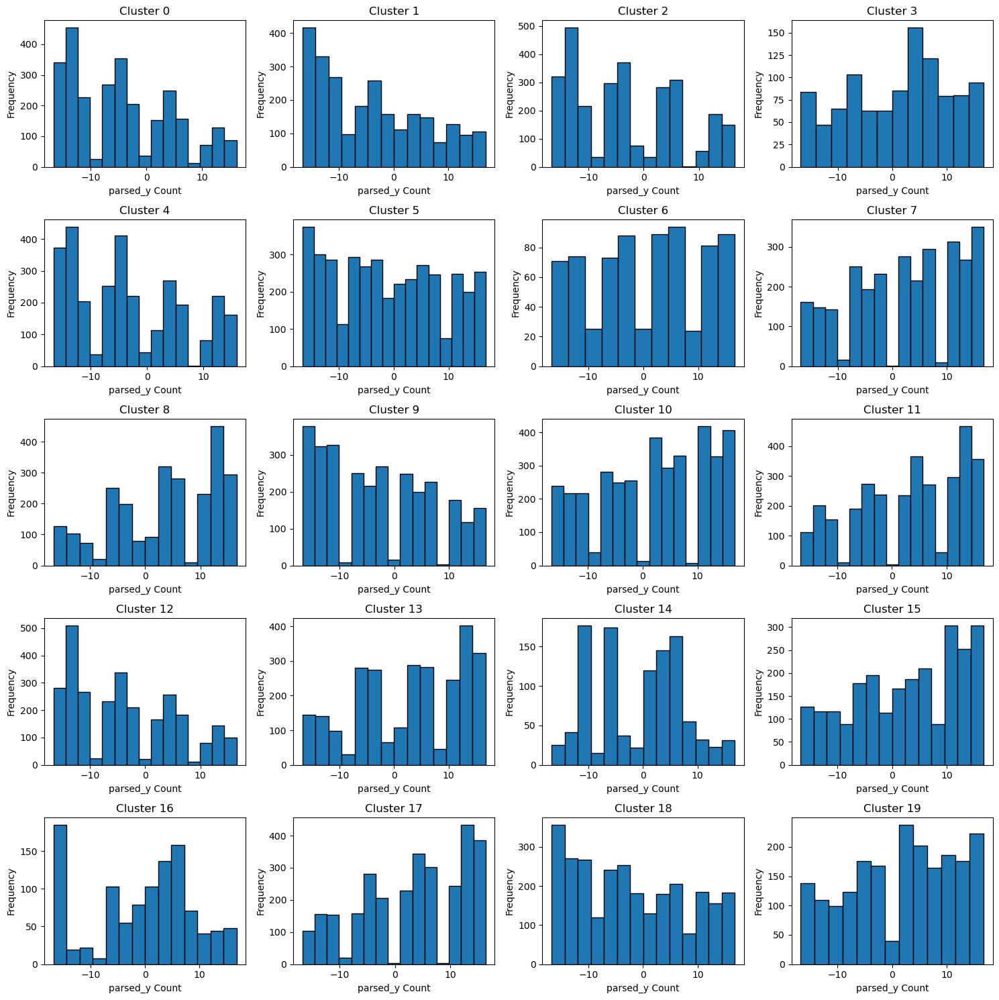

In [131]:
import math
# Calculate the number of rows and columns for subplots
num_clusters = len(unique_clusters)
num_rows = math.ceil(num_clusters / 4)
num_cols = min(4, num_clusters)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Plot histograms for each cluster
for i, cluster in enumerate(unique_clusters):
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    axes[i].hist(cluster_data['parsed_y'], bins='auto', edgecolor='black')
    axes[i].set_xlabel('parsed_y Count')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Cluster {cluster}')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

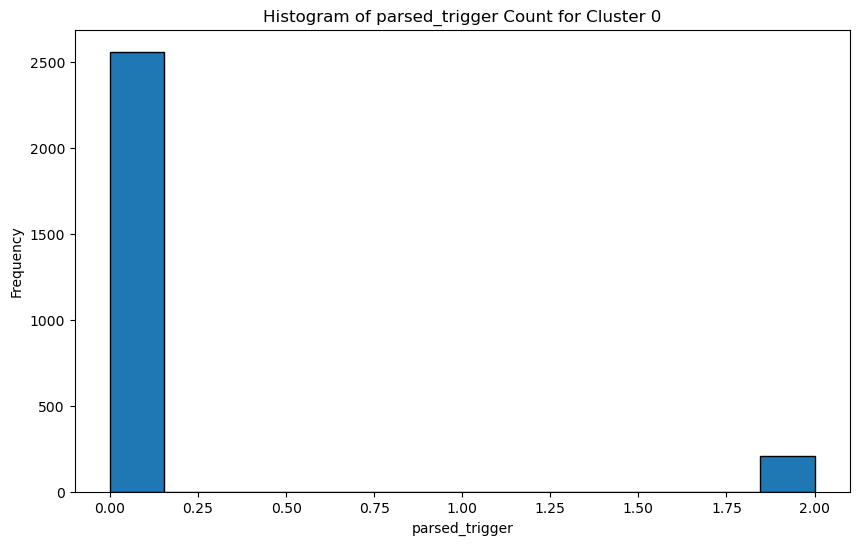

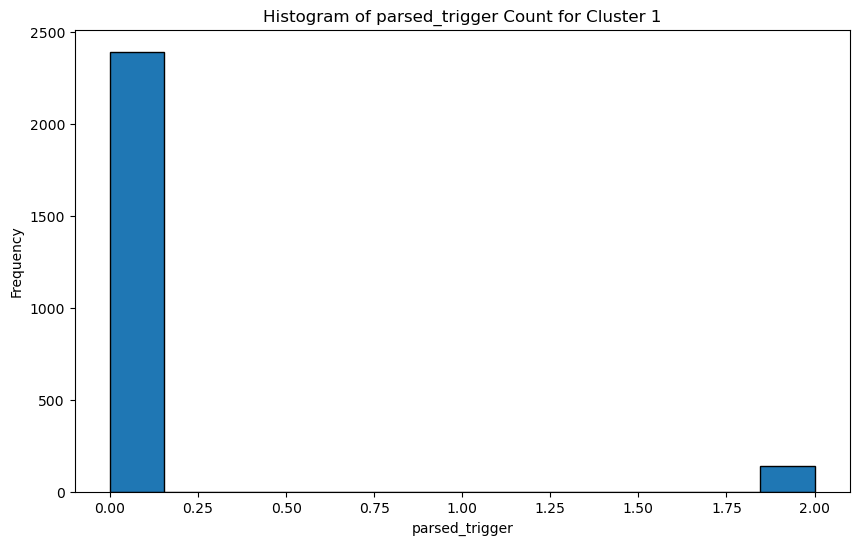

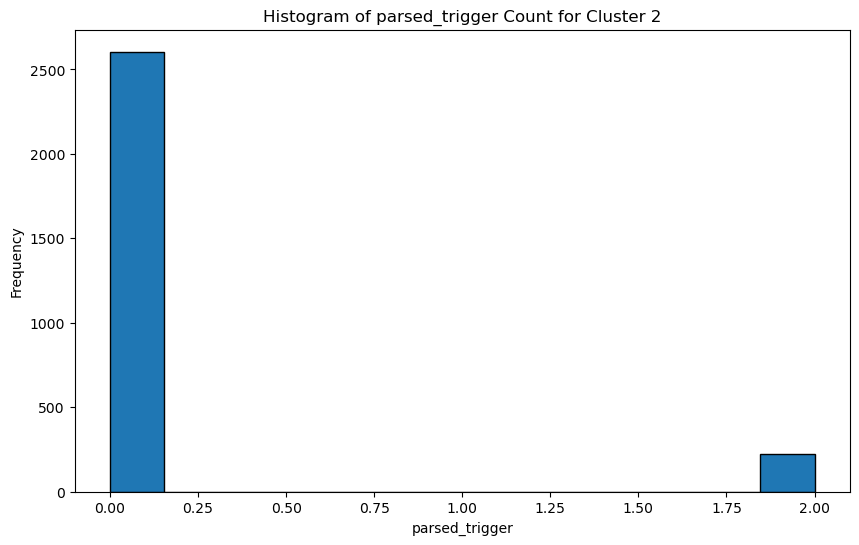

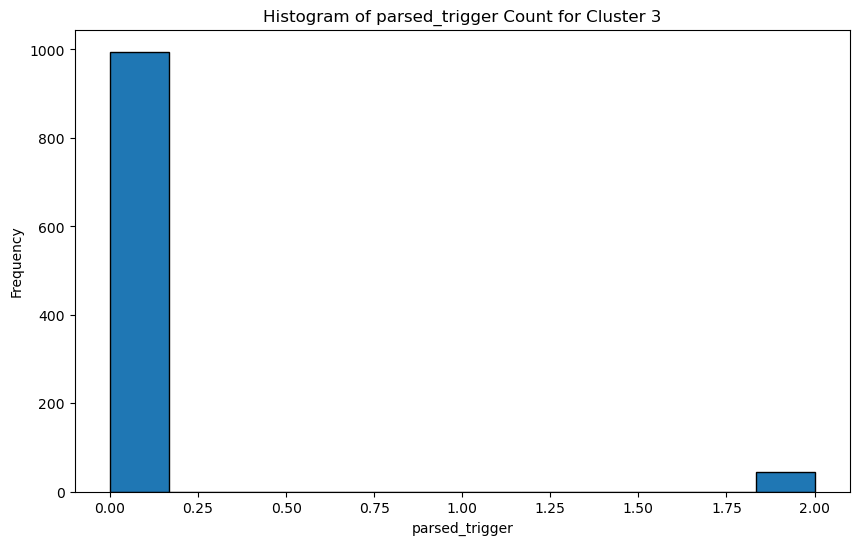

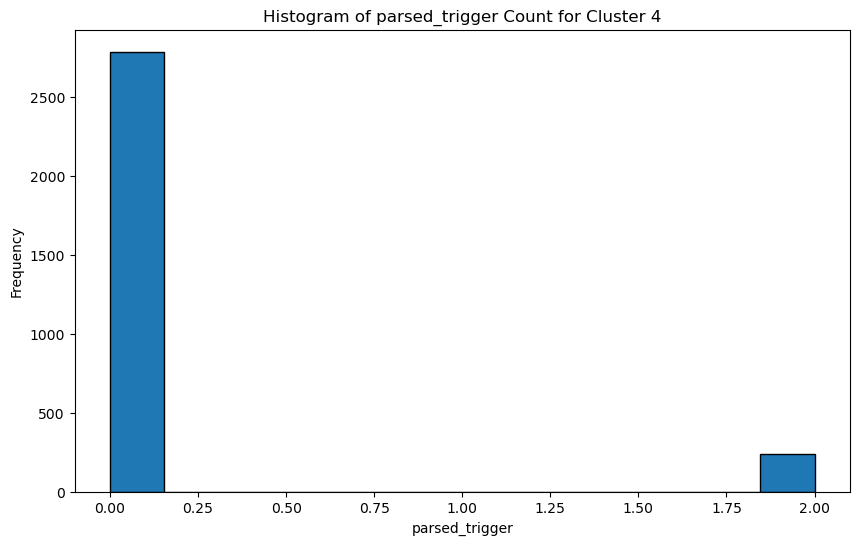

...

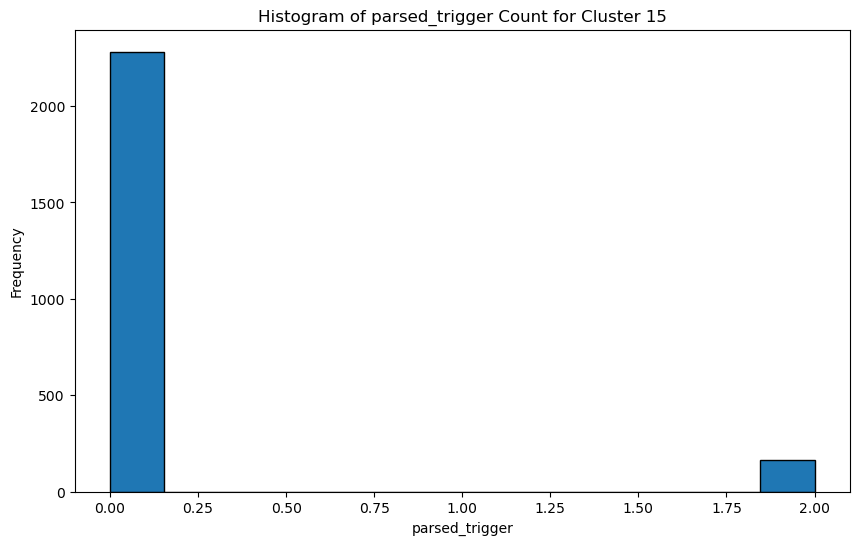

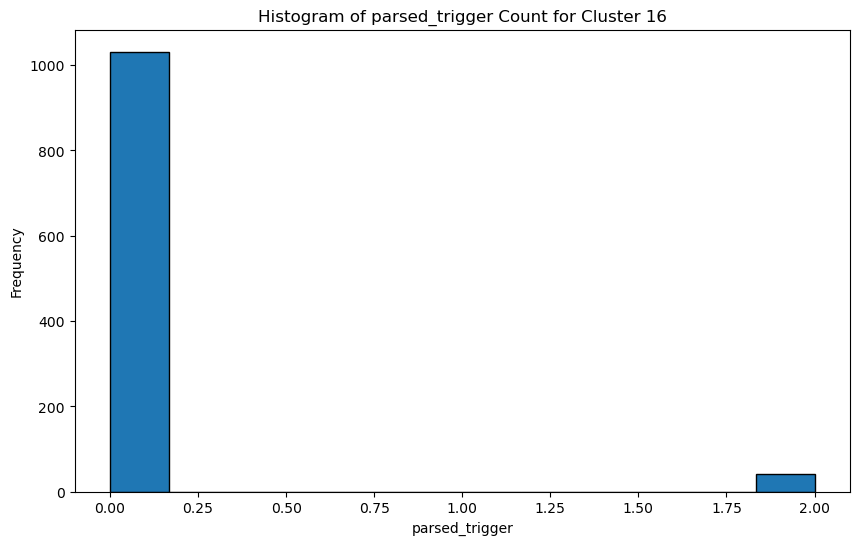

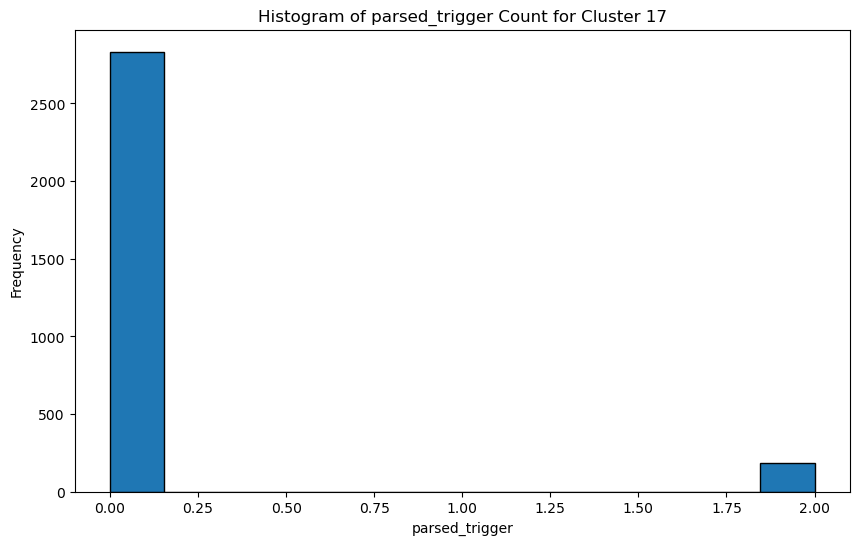

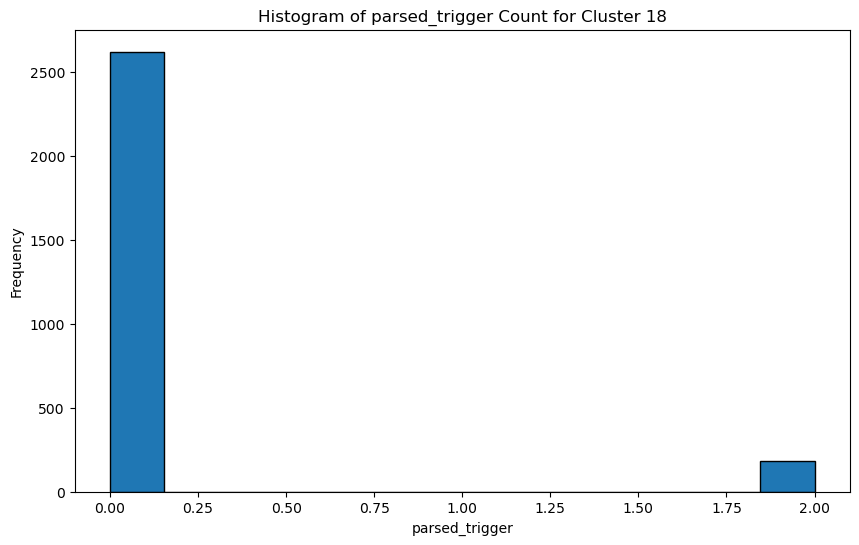

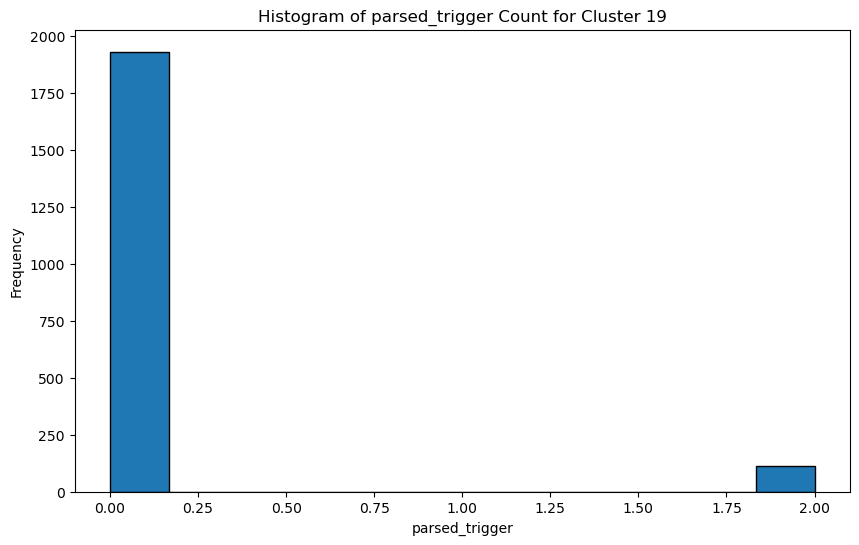

In [125]:
# Get unique clusters
unique_clusters = list(set(result_df['Cluster'].unique()))

# Plot histograms for each cluster
for cluster in unique_clusters:
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(cluster_data['parsed_trigger'], bins='auto', edgecolor='black')
    plt.xlabel('parsed_trigger')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of parsed_trigger Count for Cluster {cluster}')
    plt.show()

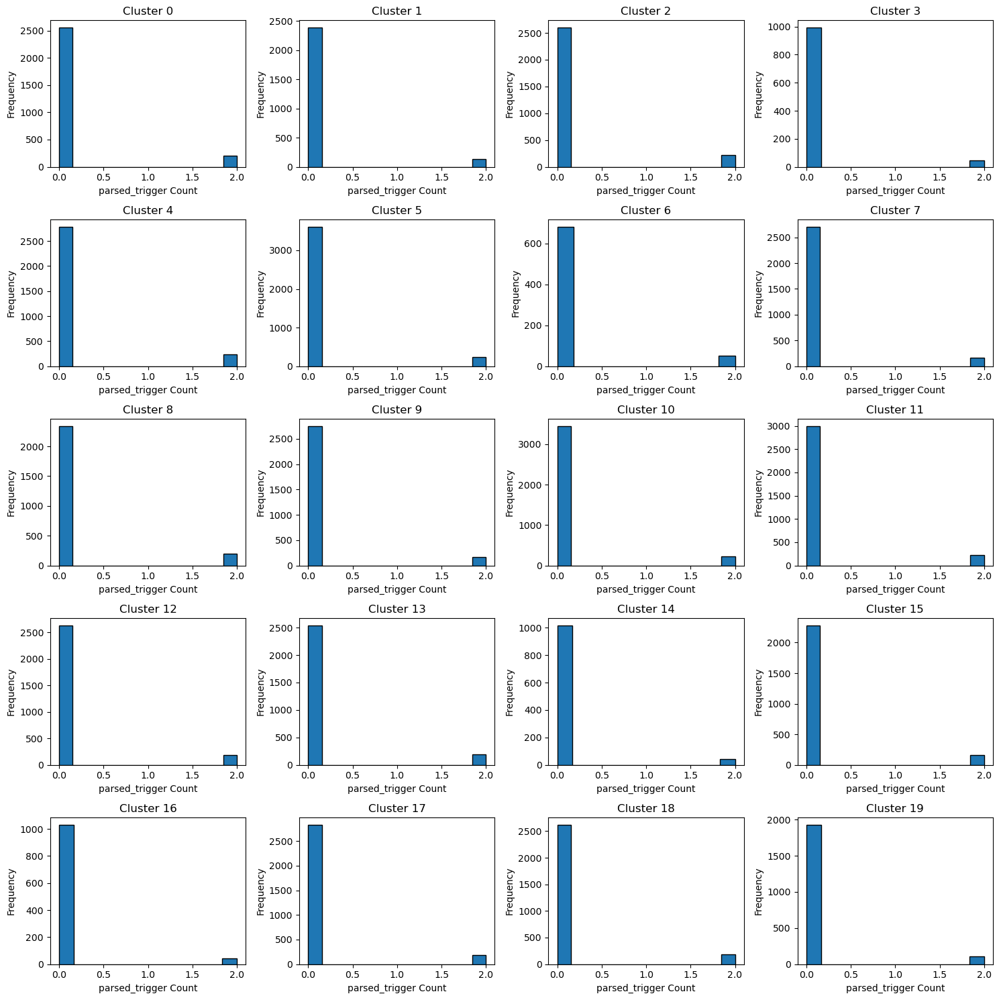

In [132]:
import math
# Calculate the number of rows and columns for subplots
num_clusters = len(unique_clusters)
num_rows = math.ceil(num_clusters / 4)
num_cols = min(4, num_clusters)

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Plot histograms for each cluster
for i, cluster in enumerate(unique_clusters):
    # Filter data for the current cluster
    cluster_data = result_df[result_df['Cluster'] == cluster]

    # Plot histogram
    axes[i].hist(cluster_data['parsed_trigger'], bins='auto', edgecolor='black')
    axes[i].set_xlabel('parsed_trigger Count')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Cluster {cluster}')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()